# All oscillation analysis

Brief 1-2 sentence description of notebook.

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
import os
import collections
import itertools

In [3]:
# Imports of all used packages and libraries
import numpy as np
import pandas as pd
from scipy import stats
from scipy.stats import mannwhitneyu

In [4]:
import matplotlib
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
import colorsys

In [5]:
from spectral_connectivity import Multitaper, Connectivity
import spectral_connectivity

In [6]:
font = {'weight' : 'bold',
        'size'   : 12}

matplotlib.rc('font', **font)

## Inputs & Data

Explanation of each input and where it comes from.

In [7]:
# Inputs and Required data loading
# input varaible names are in all caps snake case
# Whenever an input changes or is used for processing 
# the vairables are all lower in snake case
OUTPUT_DIR = r"./proc" # where data is saved should always be shown in the inputs

In [8]:
CHANNEL_MAP_AND_ALL_TRIALS_DF = pd.read_pickle("./proc/full_baseline_and_trial_lfp_traces.pkl")
MERGED_TRIALS_AND_VIDEO = pd.read_pickle("./proc/trial_SLEAP_and_metadata.pkl")

In [9]:
OUTCOME_TO_COLOR = {'lose': "red",
 'omission': "orange",
 'rewarded': "green",
 'win': "blue"}

OUTCOME_TO_COLOR = {'lose': "#951a1d",
 'omission': "#af780d",
 'rewarded': "#0499af",
 'win': "#3853a3"}

In [10]:
OUTCOME_COMPARISONS = {"win_lose": ("win", "lose"), "lose_omission": ("lose", "omission"), "win_rewarded": ("win", "rewarded")}

In [11]:
TRIAL_OR_BASELINE_TO_STYLE = {'baseline': "--", "trial": "-"}

In [12]:
TIME_HALFBANDWIDTH_PRODUCT = 2
TIME_WINDOW_DURATION = 1
TIME_WINDOW_STEP = 0.5
RESAMPLE_RATE=1000

In [13]:
BIN_TO_VELOCITY = {0: "0 to 2.5cm/s", 1: "2.5 to 5cm/s", 2: "5 to 10 cm/s", 3: "10cm/s+"}

In [14]:
MIN_VELOCITY = 0
MAX_VELOCITY = 2.5

In [15]:
ALL_BANDS = ["theta", "beta", "gamma"]
BAND_TO_FREQ = {"theta": {"low_freq": 6, "high_freq": 11}, "beta": {"low_freq": 20, "high_freq": 31}, "gamma": {"low_freq": 30, "high_freq": 51}}
BAND_TO_FREQ = {"theta": (6,11), "beta": (20,31), "gamma": (30,51)}

In [16]:
MERGED_TRIALS_AND_VIDEO.head()

,time,recording_dir,recording_file,time_stamp_index,video_file,video_frame,video_number,subject_info,competition_closeness,video_name,...,baseline_thorax_velocity,trial_thorax_velocity,trial_chunked_thorax_velocity,baseline_chunked_thorax_velocity,trial_chunked_ephys_timestamp,baseline_chunked_ephys_timestamp,trial_chunked_lfp_index,baseline_chunked_lfp_index,binned_baseline_thorax_velocity,binned_trial_thorax_velocity
0,30950500,20221214_125409_om_and_comp_6_1_and_6_3,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,27998597,20221214_125409_om_and_comp_6_1_and_6_3.1.vide...,28574,1.0,6_1_top_1_base_2_vs_6_3,win_non_comp,20221214_125409_om_and_comp_6_1_and_6_3.1,...,"[1.2476140081638165, 1.1366289071218907, 1.068...","[0.18170472850681613, 0.16961378983662276, 0.2...","[0.49872187702582166, 0.5847505450273386, 1.07...","[1.6838472335457935, 1.7550373254126983, 1.372...","[(27998597, 28018597), (28008597, 28028597), (...","[(27798597, 27818597), (27808597, 27828597), (...","[(1399929, 1400929), (1400429, 1401429), (1400...","[(1389929, 1390929), (1390429, 1391429), (1390...","[0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 1, 2, 1, 1, ...","[0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, ..."
1,32550496,20221214_125409_om_and_comp_6_1_and_6_3,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,29598593,20221214_125409_om_and_comp_6_1_and_6_3.1.vide...,30569,1.0,6_1_top_1_base_2_vs_6_3,win_non_comp,20221214_125409_om_and_comp_6_1_and_6_3.1,...,"[2.7236727895073223, 2.628037603947678, 2.5298...","[0.38577700470932025, 0.16352840888997497, 0.0...","[0.3129891797005337, 0.2588847730730972, 0.210...","[1.458421075097482, 0.5407183310858753, 0.2360...","[(29598593, 29618593), (29608593, 29628593), (...","[(29398593, 29418593), (29408593, 29428593), (...","[(1479929, 1480929), (1480429, 1481429), (1480...","[(1469929, 1470929), (1470429, 1471429), (1470...","[0, 0, 0, 0, 0, 0, 0, 0, 1, 2, 2, 2, 2, 2, 2, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
2,34350494,20221214_125409_om_and_comp_6_1_and_6_3,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,31398591,20221214_125409_om_and_comp_6_1_and_6_3.1.vide...,32813,1.0,6_1_top_1_base_2_vs_6_3,win_non_comp,20221214_125409_om_and_comp_6_1_and_6_3.1,...,"[5.210405290871598, 5.31421978904958, 5.379251...","[0.16560567036540477, 0.1278165569746918, 0.09...","[0.19868857983610794, 0.508612732615851, 0.481...","[3.439626522203859, 1.5683251160952123, 1.1535...","[(31398591, 31418591), (31408591, 31428591), (...","[(31198591, 31218591), (31208591, 31228591), (...","[(1569929, 1570929), (1570429, 1571429), (1570...","[(1559929, 1560929), (1560429, 1561429), (1560...","[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
3,35950496,20221214_125409_om_and_comp_6_1_and_6_3,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,32998593,20221214_125409_om_and_comp_6_1_and_6_3.1.vide...,34807,1.0,6_1_top_1_base_2_vs_6_3,win_non_comp,20221214_125409_om_and_comp_6_1_and_6_3.1,...,"[1.6555785442563817, 1.6866235492876445, 1.664...","[0.6307901161394641, 0.6655381193431421, 0.701...","[0.4673908122355257, 0.39056964369789443, 0.38...","[0.900289992310536, 0.3533926495729531, 0.2807...","[(32998593, 33018593), (33008593, 33028593), (...","[(32798593, 32818593), (32808593, 32828593), (...","[(1649929, 1650929), (1650429, 1651429), (1650...","[(1639929, 1640929), (1640429, 1641429), (1640...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
4,37450494,20221214_125409_om_and_comp_6_1_and_6_3,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,34498591,20221214_125409_om_and_comp_6_1_and_6_3.1.vide...,36677,1.0,6_1_top_1_base_2_vs_6_3,win_non_comp,20221214_125409_om_and_comp_6_1_and_6_3.1,...,"[0.9562352171082348, 0.8615465705681848, 0.756...","[0.15955796441347841, 0.18843088608181321, 0.2...","[0.23449342689004346, 0.17815867178863123, 0.2...","[0.3903027043299651, 0.397100110767035, 0.8705...","[(34498591, 34518591), 

In [17]:
CHANNEL_MAP_AND_ALL_TRIALS_DF.head()

,time,recording_dir,recording_file,time_stamp_index,video_file,video_frame,video_number,subject_info,competition_closeness,video_name,...,mPFC_baseline_lfp_trace,mPFC_trial_lfp_trace,vHPC_baseline_lfp_trace,vHPC_trial_lfp_trace,BLA_baseline_lfp_trace,BLA_trial_lfp_trace,LH_baseline_lfp_trace,LH_trial_lfp_trace,MD_baseline_lfp_trace,MD_trial_lfp_trace
0,6310663,20221202_134600_omission_and_competition_subje...,20221202_134600_omission_and_competition_subje...,1390826,20221202_134600_omission_and_competition_subje...,1734,1.0,6_1_top_2_base_3,rewarded,20221202_134600_omission_and_competition_subje...,...,"[1.8457601, 1.7363818, 1.6475118, 1.59738, 1.2...","[0.6927297, 0.96389693, 0.7884358, -0.04101689...","[-0.06969439, -0.09568214, -0.05315674, 0.1571...","[1.5864334, 1.5710771, 1.5970649, 1.2155175, 0...","[2.0367627, 2.1163385, 2.1618104, 2.2679114, 2...","[0.3164087, 0.36377528, 0.18757163, -0.5020857...","[3.1382985, 3.2319791, 3.2788196, 3.2881875, 3...","[0.8118982, 1.2209699, 0.87435186, -0.4028264,...","[1.3934726, 1.494771, 1.764077, 1.828315, 1.68...","[-0.9783956, -0.86721426, -0.7288553, -1.40582..."
1,7910662,20221202_134600_omission_and_competition_subje...,20221202_134600_omission_and_competition_subje...,2990825,20221202_134600_omission_and_competition_subje...,3728,1.0,6_1_top_2_base_3,rewarded,20221202_134600_omission_and_competition_subje...,...,"[1.2191132, 1.1348007, 1.2054409, 1.0960625, 0...","[1.0732753, 0.7246318, 0.7633699, 0.3782669, -...","[0.31539667, 0.23152715, 0.29767776, 0.4217101...","[0.03543783, -0.27641505, -0.40044746, -0.6638...","[0.3107247, 0.14209972, -0.05873455, -0.331566...","[0.026525281, -0.04547191, 0.11936376, -0.4092...","[-1.180375, -1.2959143, -1.3771042, -1.458294,...","[0.9492963, 0.46840277, 0.6713773, 0.043717593...","[-0.14577106, -0.16059524, 0.027177656, 0.1680...","[1.6281886, 1.349, 1.4675934, 0.9487473, -0.21..."
2,9710660,20221202_134600_omission_and_competition_subje...,20221202_134600_omission_and_competition_subje...,4790823,20221202_134600_omission_and_competition_subje...,5972,1.0,6_1_top_2_base_3,rewarded,20221202_134600_omission_and_competition_subje...,...,"[-1.2669662, -1.2965895, -1.2532939, -0.986684...","[0.28711826, 0.84996116, 1.0960625, 0.8226166,...","[-1.2556804, -1.2580429, -1.3312811, -1.118654...","[0.060244307, 0.4748669, 0.7654571, 0.6591436,...","[-1.9912907, -1.9041362, -1.9325562, -1.542255...","[0.69344664, 1.4001559, 1.7582471, 1.4304705, ...","[-0.19985186, -0.074944444, -0.18423842, -0.13...","[-0.59643286, 0.27167362, 0.6901134, 0.4371759...","[-0.32119048, -0.52872896, -0.96851283, -0.753...","[0.096357144, 0.88450915, 1.2131118, 0.8943919..."
3,11310658,20221202_134600_omission_and_competition_subje...,20221202_134600_omission_and_competition_subje...,6390821,20221202_134600_omission_and_competition_subje...,7966,1.0,6_1_top_2_base_3,omission,20221202_134600_omission_and_competition_subje...,...,"[-2.0257788, -2.0348935, -1.9323514, -1.754611...","[2.376701, 2.3015034, 1.7796774, 0.9411098, 0....","[0.16655779, 0.42879772, 0.66268736, 0.6934002...","[-1.8427671, -2.303459, -2.6802812, -3.060647,...","[-1.2637402, -1.0382752, -0.82986236, -0.74649...","[2.6771586, 2.3929594, 2.209177, 1.9761335, 1....","[-2.538743, -2.1983705, -1.8673657, -1.7143542...","[2.8447661, 2.3045416, 1.5301157, 0.96490973, ...","[-2.7647088, -2.5546997, -2.3051593, -2.055619...","[2.087738, 1.7418406, 1.1266373, 0.45954946, 0..."
4,12810657,20221202_134600_omission_and_competition_subje...,20221202_134600_omission_and_competition_subje...,7890820,20221202_134600_omission_and_competition_subje...,9836,1.0,6_1_top_2_base_3,rewarded,20221202_134600_omission_and_competition_subje...,...,"[-0.5765152, 0.25749493, 0.6403192, 0.4375135,...","[-0.043295607, 0.73602533, 0.31674156, 0.07747...","[-0.31421542, 0.19727057, 0.4453354, 0.3744597...","[0.21617076, 0.8221576, 0.58236164, 0.43116024...","[-2.1352851, -2.0576038, -2.0822346, -2.140969...","[-0.18188764, 0.113

## Outputs

Describe each output that the notebook creates. 

- Is it a plot or is it data?

- How valuable is the output and why is it valuable or useful?

## Functions 

In [18]:
def mean_of_counter(counter):
    # Extract values from the Counter and calculate the mean
    values = list(counter.values())
    return sum(values) / len(values) if values else 0  # Prevent division by zero

In [19]:
def adjust_lightness(color, amount=0.5):
    """
    Adjusts the lightness of the given color by the provided amount.
    :param color: Input color in some format that matplotlib's `to_rgb` can handle.
    :param amount: Amount to adjust. > 1 for lighter, < 1 for darker.
    :return: Adjusted color.
    """
    import colorsys
    c = mcolors.to_rgb(color)
    h, l, s = colorsys.rgb_to_hls(*c)
    return colorsys.hls_to_rgb(h, max(0, min(1, amount * l)), s)

In [20]:
def generate_gradient_colors(base_color, num_colors=10):
    """
    Generate gradient colors based on a base color.
    
    :param base_color: The base color to create a gradient from.
    :param num_colors: The number of gradient colors to generate.
    :return: List of colors.
    """
    # Convert base color to HLS (Hue, Lightness, Saturation)
    h, l, s = colorsys.rgb_to_hls(*mcolors.to_rgb(base_color))

    # Determine the step size for lightness
    middle_index = num_colors // 2
    lightness_step = l / (middle_index if middle_index > 0 else 1)

    colors = []
    for i in range(num_colors):
        if i < middle_index:
            # For the lighter colors (before the middle)
            new_lightness = l + (middle_index - i) * lightness_step
        elif i == middle_index:
            # The middle color remains the base color
            new_lightness = l
        else:
            # For the darker colors (after the middle)
            new_lightness = l - (i - middle_index) * lightness_step

        # Ensure new lightness is within the valid range [0, 1]
        new_lightness = max(0, min(new_lightness, 1))

        new_color = colorsys.hls_to_rgb(h, new_lightness, s)
        colors.append(new_color)

    return colors

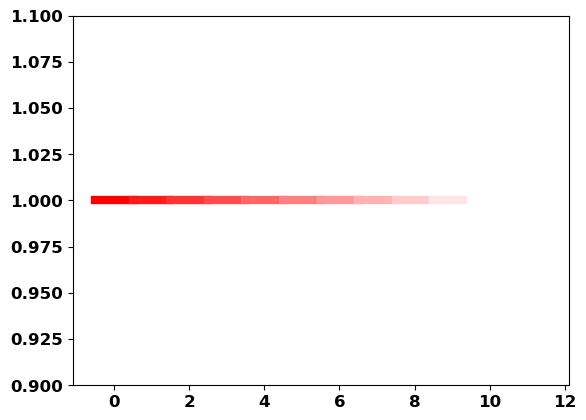

In [21]:
# Original color
original_color = 'red'  # Can be any color matplotlib understands

# Generate lighter versions
lighter_colors = [adjust_lightness(original_color, amount=1+(0.1*i)) for i in range(12)]

# Plotting to demonstrate the colors
for i, color in enumerate(lighter_colors):
    plt.plot([i-0.5, i+0.5], [1, 1], color=color, linewidth=6)  

plt.ylim(0.9, 1.1)
plt.show()

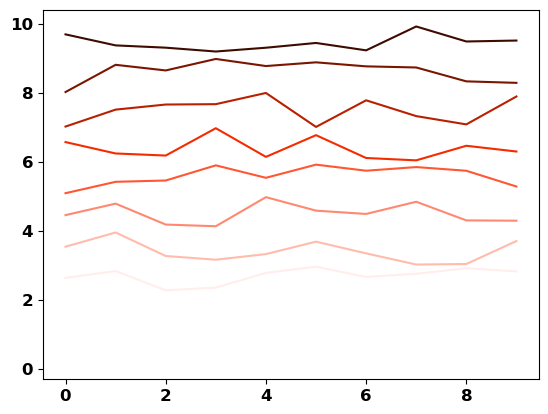

In [22]:
# Base color
base_color = '#ff5733'  # Reddish color

# Number of colors you want in the gradient
num_colors = 10

# Generate gradient colors
gradient_colors = generate_gradient_colors(base_color, num_colors)

# Set the color cycle to use the gradient colors
plt.rcParams['axes.prop_cycle'] = plt.cycler(color=gradient_colors)

# Test by plotting some data
for i in range(num_colors):
    plt.plot(np.arange(10), np.random.rand(10) + i)

plt.show()

## Processing

Describe what is done to the data here and how inputs are manipulated to generate outputs. 

In [23]:
# As much code and as many cells as required
# includes EDA and playing with data
# GO HAM!

# Ideally functions are defined here first and then data is processed using the functions

# function names are short and in snake case all lowercase
# a function name should be unique but does not have to describe the function
# doc strings describe functions not function names




In [24]:
CHANNEL_MAP_AND_ALL_TRIALS_DF.columns

Index(['time', 'recording_dir', 'recording_file', 'time_stamp_index',
       'video_file', 'video_frame', 'video_number', 'subject_info',
       'competition_closeness', 'video_name', 'all_subjects',
       'current_subject', 'trial_outcome', 'lfp_index',
       'baseline_lfp_timestamp_range', 'trial_lfp_timestamp_range',
       'baseline_ephys_timestamp_range', 'trial_ephys_timestamp_range',
       'baseline_videoframe_range', 'trial_videoframe_range', 'trial_number',
       'Cohort', 'spike_interface_mPFC', 'spike_interface_vHPC',
       'spike_interface_BLA', 'spike_interface_LH', 'spike_interface_MD',
       'mPFC_baseline_lfp_trace', 'mPFC_trial_lfp_trace',
       'vHPC_baseline_lfp_trace', 'vHPC_trial_lfp_trace',
       'BLA_baseline_lfp_trace', 'BLA_trial_lfp_trace',
       'LH_baseline_lfp_trace', 'LH_trial_lfp_trace', 'MD_baseline_lfp_trace',
       'MD_trial_lfp_trace'],
      dtype='object')

In [25]:
MERGED_TRIALS_AND_VIDEO.columns

Index(['time', 'recording_dir', 'recording_file', 'time_stamp_index',
       'video_file', 'video_frame', 'video_number', 'subject_info',
       'competition_closeness', 'video_name', 'all_subjects',
       'current_subject', 'trial_outcome', 'lfp_index',
       'baseline_lfp_timestamp_range', 'trial_lfp_timestamp_range',
       'baseline_ephys_timestamp_range', 'trial_ephys_timestamp_range',
       'baseline_videoframe_range', 'trial_videoframe_range', 'trial_number',
       'Cohort', 'spike_interface_mPFC', 'spike_interface_vHPC',
       'spike_interface_BLA', 'spike_interface_LH', 'spike_interface_MD',
       'file_path', 'start_frame', 'stop_frame', 'individual_subj', 'all_subj',
       'recording_name', 'track_names', 'subject_id', 'corner_path',
       'corner_parts', 'bottom_width', 'top_width', 'right_height',
       'left_height', 'average_height', 'average_width', 'width_ratio',
       'height_ratio', 'rescaled_locations', 'box_bottom_left', 'reward_port',
       'box_top_lef

### Merging LFP Trace dataframe and SLEAP pose tracking

In [26]:
merge_columns = ["time", "recording_file", "current_subject", "video_number"]
# Find columns in df2 that are not in merge_columns and also exist in df1, then drop them from df2
cols_to_drop = [col for col in CHANNEL_MAP_AND_ALL_TRIALS_DF.columns if col not in merge_columns and col in MERGED_TRIALS_AND_VIDEO.columns]
CHANNEL_MAP_AND_ALL_TRIALS_DF = CHANNEL_MAP_AND_ALL_TRIALS_DF.drop(columns=cols_to_drop)

In [27]:
MERGED_LFP_AND_SLEAP = pd.merge(left=CHANNEL_MAP_AND_ALL_TRIALS_DF, right=MERGED_TRIALS_AND_VIDEO, on=merge_columns, how="right")

In [28]:
MERGED_LFP_AND_SLEAP.head()

,time,recording_file,video_number,current_subject,mPFC_baseline_lfp_trace,mPFC_trial_lfp_trace,vHPC_baseline_lfp_trace,vHPC_trial_lfp_trace,BLA_baseline_lfp_trace,BLA_trial_lfp_trace,...,baseline_thorax_velocity,trial_thorax_velocity,trial_chunked_thorax_velocity,baseline_chunked_thorax_velocity,trial_chunked_ephys_timestamp,baseline_chunked_ephys_timestamp,trial_chunked_lfp_index,baseline_chunked_lfp_index,binned_baseline_thorax_velocity,binned_trial_thorax_velocity
0,30950500,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[-0.33054966, -0.41988742, -0.9134785, -1.4964...","[0.51145864, 0.29928145, 0.22111093, 0.1116721...","[0.27216667, -0.26033333, -0.8307, -1.0484333,...","[-1.1513833, -1.1845167, -1.14665, -1.1431, -1...","[-0.6486342, -0.79189086, -1.2833407, -1.73499...","[-0.44369763, -0.31436872, 0.01790708, 0.39395...",...,"[1.2476140081638165, 1.1366289071218907, 1.068...","[0.18170472850681613, 0.16961378983662276, 0.2...","[0.49872187702582166, 0.5847505450273386, 1.07...","[1.6838472335457935, 1.7550373254126983, 1.372...","[(27998597, 28018597), (28008597, 28028597), (...","[(27798597, 27818597), (27808597, 27828597), (...","[(1399929, 1400929), (1400429, 1401429), (1400...","[(1389929, 1390929), (1390429, 1391429), (1390...","[0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 1, 2, 1, 1, ...","[0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, ..."
1,32550496,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[1.1479901, 1.0943874, 1.0251507, 0.8330745, 0...","[0.32384935, 0.1630414, 0.0044668876, 0.062536...","[1.9016167, 2.1146166, 2.2791, 2.3856, 2.43056...","[-1.0224, -0.9159, -0.9963667, -0.9774333, -0....","[0.85755014, 0.8535708, 0.83964306, 0.93116814...","[1.1042699, 0.9152507, 0.29447198, -0.3024307,...",...,"[2.7236727895073223, 2.628037603947678, 2.5298...","[0.38577700470932025, 0.16352840888997497, 0.0...","[0.3129891797005337, 0.2588847730730972, 0.210...","[1.458421075097482, 0.5407183310858753, 0.2360...","[(29598593, 29618593), (29608593, 29628593), (...","[(29398593, 29418593), (29408593, 29428593), (...","[(1479929, 1480929), (1480429, 1481429), (1480...","[(1469929, 1470929), (1470429, 1471429), (1470...","[0, 0, 0, 0, 0, 0, 0, 0, 1, 2, 2, 2, 2, 2, 2, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
2,34350494,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[-0.23897848, 0.36181787, 0.122839406, -0.1474...","[-0.14964072, 0.4355215, 0.6074967, 0.317149, ...","[-1.0034667, -0.7076333, -0.69816667, -0.67923...","[0.48753333, 0.355, 0.19643334, 0.18696667, 0....","[-1.1341151, -0.62276846, -0.70235544, -0.6844...","[-0.51532596, 0.051731564, 0.16713275, 0.09152...",...,"[5.210405290871598, 5.31421978904958, 5.379251...","[0.16560567036540477, 0.1278165569746918, 0.09...","[0.19868857983610794, 0.508612732615851, 0.481...","[3.439626522203859, 1.5683251160952123, 1.1535...","[(31398591, 31418591), (31408591, 31428591), (...","[(31198591, 31218591), (31208591, 31228591), (...","[(1569929, 1570929), (1570429, 1571429), (1570...","[(1559929, 1560929), (1560429, 1561429), (1560...","[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
3,35950496,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[0.49582452, 0.18537582, 0.4042533, 0.24344537...","[-0.33948344, 0.01786755, 0.13624007, -0.12060...","[0.6023167, 0.48398334, 0.22601667, 0.04496666...","[0.1704, 0.059166666, -0.13845, -0.35026667, -...","[0.029845133, -0.6247581, -0.74413866, -0.3820...","[-1.1639602, -1.1440635, -1.1201873, -1.038610...",...,"[1.6555785442563817, 1.6866235492876445, 1.664...","[0.6307901161394641, 0.6655381193431421, 0.701...","[0.4673908122355257, 0.39056964369789443, 0.38...","[0.900289992310536, 0.3533926495729531, 0.2807...","[(32998593, 33018593), (33008593, 33028593), (...","[(32798593, 32818593), (32808593, 32828593), (...","[(1649929, 1650929), (1650429, 1651429), (1650...","[(1639929, 1640929), (1640429, 1641429), (1640...","[0, 0, 0, 0

## Power Calcuation

- Calcuating the power at each frequency band

In [29]:
trace_columns = [col for col in MERGED_LFP_AND_SLEAP.columns if "trace" in col]

In [30]:
for col in trace_columns:
    region_and_baseline_or_trial = "_".join(col.split("_")[:2])
    MERGED_LFP_AND_SLEAP["{}_multitaper".format(region_and_baseline_or_trial)] = MERGED_LFP_AND_SLEAP["{}_lfp_trace".format(region_and_baseline_or_trial)].apply(lambda x: Multitaper(time_series=x, sampling_frequency=RESAMPLE_RATE, time_halfbandwidth_product=TIME_HALFBANDWIDTH_PRODUCT,                                                                              time_window_duration=TIME_WINDOW_DURATION, time_window_step=TIME_WINDOW_STEP                                                                                                                                         ))

In [31]:
for col in trace_columns:
    print(col)
    region_and_baseline_or_trial = "_".join(col.split("_")[:2])
    MERGED_LFP_AND_SLEAP["{}_connectivity".format(region_and_baseline_or_trial)] = MERGED_LFP_AND_SLEAP["{}_multitaper".format(region_and_baseline_or_trial)].apply(lambda x: Connectivity.from_multitaper(x))

mPFC_baseline_lfp_trace
mPFC_trial_lfp_trace
vHPC_baseline_lfp_trace
vHPC_trial_lfp_trace
BLA_baseline_lfp_trace
BLA_trial_lfp_trace
LH_baseline_lfp_trace
LH_trial_lfp_trace
MD_baseline_lfp_trace
MD_trial_lfp_trace


In [32]:
for col in trace_columns:
    region_and_baseline_or_trial = "_".join(col.split("_")[:2])
    MERGED_LFP_AND_SLEAP["{}_frequencies".format(region_and_baseline_or_trial)] = MERGED_LFP_AND_SLEAP["{}_connectivity".format(region_and_baseline_or_trial)].apply(lambda x: x.frequencies)

In [33]:
for col in trace_columns:
    region_and_baseline_or_trial = "_".join(col.split("_")[:2])
    MERGED_LFP_AND_SLEAP["{}_all_window_power".format(region_and_baseline_or_trial)] = MERGED_LFP_AND_SLEAP["{}_connectivity".format(region_and_baseline_or_trial)].apply(lambda x: x.power().squeeze())

In [34]:
MERGED_LFP_AND_SLEAP = MERGED_LFP_AND_SLEAP.drop(columns=[col for col in MERGED_LFP_AND_SLEAP if "multitaper" in col], errors="ignore")
MERGED_LFP_AND_SLEAP = MERGED_LFP_AND_SLEAP.drop(columns=[col for col in MERGED_LFP_AND_SLEAP if "connectivity" in col], errors="ignore")

In [35]:
MERGED_LFP_AND_SLEAP.head()

,time,recording_file,video_number,current_subject,mPFC_baseline_lfp_trace,mPFC_trial_lfp_trace,vHPC_baseline_lfp_trace,vHPC_trial_lfp_trace,BLA_baseline_lfp_trace,BLA_trial_lfp_trace,...,mPFC_baseline_all_window_power,mPFC_trial_all_window_power,vHPC_baseline_all_window_power,vHPC_trial_all_window_power,BLA_baseline_all_window_power,BLA_trial_all_window_power,LH_baseline_all_window_power,LH_trial_all_window_power,MD_baseline_all_window_power,MD_trial_all_window_power
0,30950500,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[-0.33054966, -0.41988742, -0.9134785, -1.4964...","[0.51145864, 0.29928145, 0.22111093, 0.1116721...","[0.27216667, -0.26033333, -0.8307, -1.0484333,...","[-1.1513833, -1.1845167, -1.14665, -1.1431, -1...","[-0.6486342, -0.79189086, -1.2833407, -1.73499...","[-0.44369763, -0.31436872, 0.01790708, 0.39395...",...,"[[0.009823293555262794, 0.013924021048577154, ...","[[0.003615743090164337, 0.020784870210994073, ...","[[0.004182283533414606, 0.004589243208990474, ...","[[0.011697103017073326, 0.03404168621796775, 0...","[[0.005353983454892757, 0.01006784871417599, 0...","[[0.0019678294433681668, 0.003568165862318084,...","[[0.014156556290954811, 0.015811485476915764, ...","[[0.01740978843109557, 0.015614214245673032, 0...","[[0.032420332093765145, 0.02588818663960985, 0...","[[0.001126425519817756, 0.0051790350768731565,..."
1,32550496,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[1.1479901, 1.0943874, 1.0251507, 0.8330745, 0...","[0.32384935, 0.1630414, 0.0044668876, 0.062536...","[1.9016167, 2.1146166, 2.2791, 2.3856, 2.43056...","[-1.0224, -0.9159, -0.9963667, -0.9774333, -0....","[0.85755014, 0.8535708, 0.83964306, 0.93116814...","[1.1042699, 0.9152507, 0.29447198, -0.3024307,...",...,"[[0.024759951820400854, 0.021303476025368605, ...","[[0.005252625251440256, 0.009544076854592055, ...","[[0.002096892191184231, 0.013303788944311482, ...","[[0.02194185695245405, 0.019980301951269416, 0...","[[0.008392790045477449, 0.009164992589423358, ...","[[0.011354971394795787, 0.02494881560604016, 0...","[[0.009203195865696318, 0.012369094785452853, ...","[[0.004755250402581861, 0.015413926822757013, ...","[[0.029927421519669848, 0.021055238070196908, ...","[[0.005268082999020396, 0.01164688053394768, 0..."
2,34350494,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[-0.23897848, 0.36181787, 0.122839406, -0.1474...","[-0.14964072, 0.4355215, 0.6074967, 0.317149, ...","[-1.0034667, -0.7076333, -0.69816667, -0.67923...","[0.48753333, 0.355, 0.19643334, 0.18696667, 0....","[-1.1341151, -0.62276846, -0.70235544, -0.6844...","[-0.51532596, 0.051731564, 0.16713275, 0.09152...",...,"[[0.011362483623005544, 0.00842350511603944, 0...","[[0.008142487608192315, 0.005764882508257109, ...","[[0.0016166978337783084, 0.005705520165816951,...","[[0.04982180678916146, 0.032510780389063056, 0...","[[0.005384772975860021, 0.003902799415786651, ...","[[0.04033438993135537, 0.030887886395683174, 0...","[[0.02097411820985093, 0.012691784633844525, 0...","[[0.05102492929045597, 0.03262755069515353, 0....","[[0.019964179520096176, 0.0115436746873894, 0....","[[0.03412912947336931, 0.023354876559489354, 0..."
3,35950496,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[0.49582452, 0.18537582, 0.4042533, 0.24344537...","[-0.33948344, 0.01786755, 0.13624007, -0.12060...","[0.6023167, 0.48398334, 0.22601667, 0.04496666...","[0.1704, 0.059166666, -0.13845, -0.35026667, -...","[0.029845133, -0.6247581, -0.74413866, -0.3820...","[-1.1639602, -1.1440635, -1.1201873, -1.038610...",...,"[[0.006542340959047896, 0.004409322903575986, ...","[[0.0017563036283226264, 0.0012924743905227834...","[[0.023311719774968133, 0.016007367431799868, ...","[[0.003256334458860641, 0.0053025934708259715,...","[[0.011390110949094753, 0.012101279184300179, ...","[[0.008089393889266917, 0.010055278188354798, ...","[[0.005229034265379665, 0.004547139730694433, ...","[[0.003590199461878245, 0.0042194869616777545,...","[[0.0046146

In [36]:
MERGED_LFP_AND_SLEAP.columns

Index(['time', 'recording_file', 'video_number', 'current_subject',
       'mPFC_baseline_lfp_trace', 'mPFC_trial_lfp_trace',
       'vHPC_baseline_lfp_trace', 'vHPC_trial_lfp_trace',
       'BLA_baseline_lfp_trace', 'BLA_trial_lfp_trace',
       'LH_baseline_lfp_trace', 'LH_trial_lfp_trace', 'MD_baseline_lfp_trace',
       'MD_trial_lfp_trace', 'recording_dir', 'time_stamp_index', 'video_file',
       'video_frame', 'subject_info', 'competition_closeness', 'video_name',
       'all_subjects', 'trial_outcome', 'lfp_index',
       'baseline_lfp_timestamp_range', 'trial_lfp_timestamp_range',
       'baseline_ephys_timestamp_range', 'trial_ephys_timestamp_range',
       'baseline_videoframe_range', 'trial_videoframe_range', 'trial_number',
       'Cohort', 'spike_interface_mPFC', 'spike_interface_vHPC',
       'spike_interface_BLA', 'spike_interface_LH', 'spike_interface_MD',
       'file_path', 'start_frame', 'stop_frame', 'individual_subj', 'all_subj',
       'recording_name', 'track_na

### Averaging the power for all the windows(without any velocity parsing) 

In [37]:
baseline_windowed_power_columns = [col for col in MERGED_LFP_AND_SLEAP.columns if "baseline_all_window_power" in col]
trial_windowed_power_columns = [col for col in MERGED_LFP_AND_SLEAP.columns if "trial_all_window_power" in col]

In [38]:
trial_windowed_power_columns

['mPFC_trial_all_window_power',
 'vHPC_trial_all_window_power',
 'BLA_trial_all_window_power',
 'LH_trial_all_window_power',
 'MD_trial_all_window_power']

In [39]:
for col in baseline_windowed_power_columns:
    region_and_baseline_or_trial = "_".join(col.split("_")[:2])
    MERGED_LFP_AND_SLEAP["{}_all_window_averaged_power".format(region_and_baseline_or_trial)] = MERGED_LFP_AND_SLEAP.apply(lambda x: np.array(x[col]).mean(axis=0), axis=1)

In [40]:
for col in trial_windowed_power_columns:
    region_and_baseline_or_trial = "_".join(col.split("_")[:2])
    MERGED_LFP_AND_SLEAP["{}_all_window_averaged_power".format(region_and_baseline_or_trial)] = MERGED_LFP_AND_SLEAP.apply(lambda x: np.array(x[col]).mean(axis=0), axis=1)

In [41]:
MERGED_LFP_AND_SLEAP = MERGED_LFP_AND_SLEAP.drop(columns=[col for col in MERGED_LFP_AND_SLEAP if "multitaper" in col], errors="ignore")
MERGED_LFP_AND_SLEAP = MERGED_LFP_AND_SLEAP.drop(columns=[col for col in MERGED_LFP_AND_SLEAP if "connectivity" in col], errors="ignore")

In [42]:
MERGED_LFP_AND_SLEAP.drop(columns=trace_columns, errors="ignore").to_pickle("./proc/rce_lfp_all_window_power.pkl")


# Parsing by velocity

- Getting a mask for each segment based on velocity

In [43]:
all_bins = set(x for lst in MERGED_LFP_AND_SLEAP["binned_baseline_thorax_velocity"] for x in lst)

In [44]:
all_bins

{0, 1, 2, 3}

In [45]:
all_bin_df = []
for bin in all_bins:
    current_df = MERGED_LFP_AND_SLEAP.copy()
    current_df["binned_trial_velocity_mask"] = current_df["binned_trial_thorax_velocity"].apply(lambda x: [index for index, num in enumerate(x) if num == bin])
    current_df["binned_baseline_velocity_mask"] = current_df["binned_baseline_thorax_velocity"].apply(lambda x: [index for index, num in enumerate(x) if num == bin])
    for col in baseline_windowed_power_columns:
        region_and_baseline_or_trial = "_".join(col.split("_")[:2])
        current_df["{}_velocity_parsed_window_averaged_power".format(region_and_baseline_or_trial)] = current_df.apply(lambda x: np.nanmean(np.array([x[col][i] for i in x["binned_baseline_velocity_mask"]]), axis=0), axis=1)

    for col in trial_windowed_power_columns:
        region_and_baseline_or_trial = "_".join(col.split("_")[:2])
        current_df["{}_velocity_parsed_window_averaged_power".format(region_and_baseline_or_trial)] = current_df.apply(lambda x: np.nanmean(np.array([x[col][i] for i in x["binned_trial_velocity_mask"]]), axis=0), axis=1)
    
    current_df["velocity_bin"] = bin
    all_bin_df.append(current_df)
        
    
    


In [46]:
VELCOITY_PARSED_MERGED_LFP_AND_SLEAP = pd.concat(all_bin_df).reset_index(drop=True)

## Plotting all the similar velocities together

In [47]:
window_averaged_power_columns = [col for col in VELCOITY_PARSED_MERGED_LFP_AND_SLEAP.columns if "velocity_parsed_window_averaged_power" in col]

In [48]:
window_averaged_power_columns

['mPFC_baseline_velocity_parsed_window_averaged_power',
 'vHPC_baseline_velocity_parsed_window_averaged_power',
 'BLA_baseline_velocity_parsed_window_averaged_power',
 'LH_baseline_velocity_parsed_window_averaged_power',
 'MD_baseline_velocity_parsed_window_averaged_power',
 'mPFC_trial_velocity_parsed_window_averaged_power',
 'vHPC_trial_velocity_parsed_window_averaged_power',
 'BLA_trial_velocity_parsed_window_averaged_power',
 'LH_trial_velocity_parsed_window_averaged_power',
 'MD_trial_velocity_parsed_window_averaged_power']

- Grouping by trial outcome and velocity

In [49]:
MERGED_LFP_AND_SLEAP.head()

,time,recording_file,video_number,current_subject,mPFC_baseline_lfp_trace,mPFC_trial_lfp_trace,vHPC_baseline_lfp_trace,vHPC_trial_lfp_trace,BLA_baseline_lfp_trace,BLA_trial_lfp_trace,...,mPFC_baseline_all_window_averaged_power,vHPC_baseline_all_window_averaged_power,BLA_baseline_all_window_averaged_power,LH_baseline_all_window_averaged_power,MD_baseline_all_window_averaged_power,mPFC_trial_all_window_averaged_power,vHPC_trial_all_window_averaged_power,BLA_trial_all_window_averaged_power,LH_trial_all_window_averaged_power,MD_trial_all_window_averaged_power
0,30950500,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[-0.33054966, -0.41988742, -0.9134785, -1.4964...","[0.51145864, 0.29928145, 0.22111093, 0.1116721...","[0.27216667, -0.26033333, -0.8307, -1.0484333,...","[-1.1513833, -1.1845167, -1.14665, -1.1431, -1...","[-0.6486342, -0.79189086, -1.2833407, -1.73499...","[-0.44369763, -0.31436872, 0.01790708, 0.39395...",...,"[0.01579940523904916, 0.0165626647529655, 0.02...","[0.007338252748333259, 0.01089563666395944, 0....","[0.013091607841038322, 0.014117608416465038, 0...","[0.022964455789557244, 0.022290898817971163, 0...","[0.02557420165245759, 0.026540399430798854, 0....","[0.013578532216685993, 0.01736326663715145, 0....","[0.005884176938003947, 0.01262773509768471, 0....","[0.016782418918595676, 0.015240122116290227, 0...","[0.03241093477294236, 0.03003938250305729, 0.0...","[0.02394606557277414, 0.024972355567400052, 0...."
1,32550496,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[1.1479901, 1.0943874, 1.0251507, 0.8330745, 0...","[0.32384935, 0.1630414, 0.0044668876, 0.062536...","[1.9016167, 2.1146166, 2.2791, 2.3856, 2.43056...","[-1.0224, -0.9159, -0.9963667, -0.9774333, -0....","[0.85755014, 0.8535708, 0.83964306, 0.93116814...","[1.1042699, 0.9152507, 0.29447198, -0.3024307,...",...,"[0.01043973810516993, 0.011995901256217315, 0....","[0.006520190897142798, 0.009908554975019851, 0...","[0.006274318131038264, 0.00691078513224769, 0....","[0.01052940561515397, 0.011517583637301586, 0....","[0.013189469018915191, 0.012605535448486686, 0...","[0.005072513655663902, 0.0071730776351884, 0.0...","[0.017807810758419772, 0.02051735783988241, 0....","[0.0075150800916258895, 0.012030467854449603, ...","[0.003644272984766944, 0.005808118645131345, 0...","[0.006489759161394153, 0.007582477136466669, 0..."
2,34350494,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[-0.23897848, 0.36181787, 0.122839406, -0.1474...","[-0.14964072, 0.4355215, 0.6074967, 0.317149, ...","[-1.0034667, -0.7076333, -0.69816667, -0.67923...","[0.48753333, 0.355, 0.19643334, 0.18696667, 0....","[-1.1341151, -0.62276846, -0.70235544, -0.6844...","[-0.51532596, 0.051731564, 0.16713275, 0.09152...",...,"[0.005078069620033379, 0.007847947527141026, 0...","[0.013600617428570527, 0.019533499354359572, 0...","[0.006141355758002356, 0.009303619594021637, 0...","[0.007468537947027687, 0.010884286729309219, 0...","[0.004814152657455484, 0.006184218967929381, 0...","[0.01043389231412404, 0.011229291113011746, 0....","[0.018798404711232963, 0.024949532187259045, 0...","[0.009525639680784495, 0.010941343792716796, 0...","[0.016095087975310174, 0.015224296452442521, 0...","[0.011809376046566988, 0.010816138136563104, 0..."
3,35950496,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[0.49582452, 0.18537582, 0.4042533, 0.24344537...","[-0.33948344, 0.01786755, 0.13624007, -0.12060...","[0.6023167, 0.48398334, 0.22601667, 0.04496666...","[0.1704, 0.059166666, -0.13845, -0.35026667, -...","[0.029845133, -0.6247581, -0.74413866, -0.3820...","[-1.1639602, -1.1440635, -1.1201873, -1.038610...",...,"[0.008870300252232993, 0.009661322703319016, 0...","[0.01636629887281683, 0.024804479917894477, 0....","[0.00689989260430601, 0.009437438029868149, 0....","[0.010951516062517489, 0.010717930878165088, 0...","[0.008629680530200008, 0.008992947836672616, 0...","[0.006360855718027482, 0.007822405773560855, 0...","[0.0164348816792982, 0.02

In [50]:
grouped_all_trials_df = VELCOITY_PARSED_MERGED_LFP_AND_SLEAP.groupby(['trial_outcome', 'velocity_bin']).agg({k: lambda x: np.vstack([arr for arr in x.tolist() if not np.any(np.isnan(arr))]) for k in window_averaged_power_columns}).reset_index()

In [51]:
grouped_all_trials_df = pd.melt(grouped_all_trials_df, id_vars =['trial_outcome', 'velocity_bin'], value_vars =grouped_all_trials_df.drop(columns=["trial_outcome", "velocity_bin"]).columns, value_name="power", var_name="region_and_baseline_or_trial") 

In [52]:
grouped_all_trials_df.head()

,trial_outcome,velocity_bin,region_and_baseline_or_trial,power
0,lose,0,mPFC_baseline_velocity_parsed_window_averaged_...,"[[0.020090183352770068, 0.025215370983250298, ..."
1,lose,1,mPFC_baseline_velocity_parsed_window_averaged_...,"[[0.012096547095824696, 0.008096570469847445, ..."
2,lose,2,mPFC_baseline_velocity_parsed_window_averaged_...,"[[0.006160721145788189, 0.011262819711789785, ..."
3,lose,3,mPFC_baseline_velocity_parsed_window_averaged_...,"[[0.01347149329683217, 0.022370986693883776, 0..."
4,omission,0,mPFC_baseline_velocity_parsed_window_averaged_...,"[[0.015192233263166573, 0.014732912277589506, ..."


In [53]:
grouped_all_trials_df["brain_region"] = grouped_all_trials_df["region_and_baseline_or_trial"].apply(lambda x: x.split("_")[0].strip())

In [54]:
grouped_all_trials_df["trial_or_baseline"] = grouped_all_trials_df["region_and_baseline_or_trial"].apply(lambda x: x.split("_")[1].strip())

In [55]:
grouped_all_trials_df = grouped_all_trials_df[grouped_all_trials_df["trial_or_baseline"] == "trial"].reset_index(drop=True)

In [56]:
grouped_all_trials_df["mean_power"] = grouped_all_trials_df["power"].apply(lambda x: np.nanmean(np.vstack(x), axis=0))

In [57]:
grouped_all_trials_df["std_power"] = grouped_all_trials_df["power"].apply(lambda x: np.nanstd(np.vstack(x), axis=0))

In [58]:
grouped_all_trials_df["n_trials"] = grouped_all_trials_df["power"].apply(lambda x: np.sum(~np.isnan(x), axis=0))

In [59]:
grouped_all_trials_df["sem_power"] = grouped_all_trials_df.apply(lambda x: x["std_power"] / np.sqrt(x["n_trials"]), axis=1)

In [60]:
grouped_all_trials_df["trial_outcome"].unique()

array(['lose', 'omission', 'rewarded', 'win'], dtype=object)

In [61]:
grouped_all_trials_df

,trial_outcome,velocity_bin,region_and_baseline_or_trial,power,brain_region,trial_or_baseline,mean_power,std_power,n_trials,sem_power
0,lose,0,mPFC_trial_velocity_parsed_window_averaged_power,"[[0.010234599238710826, 0.009366231284259053, ...",mPFC,trial,"[0.01891495624590608, 0.02114256227286179, 0.0...","[0.03437053982794283, 0.026494911945311873, 0....","[81, 81, 81, 81, 81, 81, 81, 81, 81, 81, 81, 8...","[0.003818948869771426, 0.002943879105034653, 0..."
1,lose,1,mPFC_trial_velocity_parsed_window_averaged_power,"[[0.013833584504246519, 0.014530507389965114, ...",mPFC,trial,"[0.015600753017007682, 0.01842456382954011, 0....","[0.01898563580327672, 0.015706631358732136, 0....","[77, 77, 77, 77, 77, 77, 77, 77, 77, 77, 77, 7...","[0.002163614000594156, 0.0017899367638801406, ..."
2,lose,2,mPFC_trial_velocity_parsed_window_averaged_power,"[[0.03963123259144771, 0.03165558654566546, 0....",mPFC,trial,"[0.01719302539978129, 0.017455315576698174, 0....","[0.023088077353077656, 0.017029764575193087, 0...","[65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 6...","[0.002863723546664102, 0.002112282329200779, 0..."
3,lose,3,mPFC_trial_velocity_parsed_window_averaged_power,"[[0.0047511454863413604, 0.015700403701863784,...",mPFC,trial,"[0.01203788010746564, 0.016038257500336606, 0....","[0.016996145046731425, 0.01731714976271093, 0....","[42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 4...","[0.002622562117152274, 0.0026720942201815413, ..."
4,omission,0,mPFC_trial_velocity_parsed_window_averaged_power,"[[0.02258350835989575, 0.02355255899717113, 0....",mPFC,trial,"[0.02483009977385367, 0.02491870391941492, 0.0...","[0.06129572850439874, 0.0481991295329668, 0.05...","[18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 1...","[0.014447541761076635, 0.011360643780016541, 0..."
...,...,...,...,...,...,...,...,...,...,...
75,rewarded,3,MD_trial_velocity_parsed_window_averaged_power,"[[0.015432044660759599, 0.012118595270495247, ...",MD,trial,"[0.008967613658556896, 0.01086669235121607, 0....","[0.004455846700438424, 0.005154846553345366, 0...","[4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, ...","[0.002227923350219212, 0.002577423276672683, 0..."
76,win,0,MD_trial_velocity_parsed_window_averaged_power,"[[0.014378295669285448, 0.015305386679455314, ...",MD,trial,"[0.01022638398880001, 0.012749822688856294, 0....","[0.022842571055716885, 0.02372200007590737, 0....","[92, 92, 92, 92, 92, 92, 92, 92, 92, 92, 92, 9...","[0.0023815026596199513, 0.0024731894730448544,..."
77,win,1,MD_trial_velocity_parsed_window_averaged_power,"[[0.050735821302542464, 0.05203986845364532, 0...",MD,trial,"[0.01626936967994091, 0.0180048255872293, 0.02...","[0.049089740455076525, 0.043779011858819626, 0...","[48, 48, 48, 48, 48, 48, 48, 48, 48, 48, 48, 4...","[0.007085493716546824, 0.006318956070386333, 0..."
78,win,2,MD_trial_velocity_parsed_window_averaged_power,"[[0.04824182039427767, 0.03439085762094281, 0....",MD,trial,"[0.01418130523510523, 0.012864387669837113, 0....","[0.015460371047051075, 0.010549837896057079, 0...","[24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 2...","[0.003155835024947803, 0.00215347664286809, 0...."


## Drawing all velocity bins together for each trial outcome

In [62]:
grouped_all_trials_df.head()

,trial_outcome,velocity_bin,region_and_baseline_or_trial,power,brain_region,trial_or_baseline,mean_power,std_power,n_trials,sem_power
0,lose,0,mPFC_trial_velocity_parsed_window_averaged_power,"[[0.010234599238710826, 0.009366231284259053, ...",mPFC,trial,"[0.01891495624590608, 0.02114256227286179, 0.0...","[0.03437053982794283, 0.026494911945311873, 0....","[81, 81, 81, 81, 81, 81, 81, 81, 81, 81, 81, 8...","[0.003818948869771426, 0.002943879105034653, 0..."
1,lose,1,mPFC_trial_velocity_parsed_window_averaged_power,"[[0.013833584504246519, 0.014530507389965114, ...",mPFC,trial,"[0.015600753017007682, 0.01842456382954011, 0....","[0.01898563580327672, 0.015706631358732136, 0....","[77, 77, 77, 77, 77, 77, 77, 77, 77, 77, 77, 7...","[0.002163614000594156, 0.0017899367638801406, ..."
2,lose,2,mPFC_trial_velocity_parsed_window_averaged_power,"[[0.03963123259144771, 0.03165558654566546, 0....",mPFC,trial,"[0.01719302539978129, 0.017455315576698174, 0....","[0.023088077353077656, 0.017029764575193087, 0...","[65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 6...","[0.002863723546664102, 0.002112282329200779, 0..."
3,lose,3,mPFC_trial_velocity_parsed_window_averaged_power,"[[0.0047511454863413604, 0.015700403701863784,...",mPFC,trial,"[0.01203788010746564, 0.016038257500336606, 0....","[0.016996145046731425, 0.01731714976271093, 0....","[42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 4...","[0.002622562117152274, 0.0026720942201815413, ..."
4,omission,0,mPFC_trial_velocity_parsed_window_averaged_power,"[[0.02258350835989575, 0.02355255899717113, 0....",mPFC,trial,"[0.02483009977385367, 0.02491870391941492, 0.0...","[0.06129572850439874, 0.0481991295329668, 0.05...","[18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 1...","[0.014447541761076635, 0.011360643780016541, 0..."


In [63]:
ALL_FREQUENCIES = [int(num) for num in VELCOITY_PARSED_MERGED_LFP_AND_SLEAP[[col for col in VELCOITY_PARSED_MERGED_LFP_AND_SLEAP if "frequencies" in col][0]].iloc[0]]

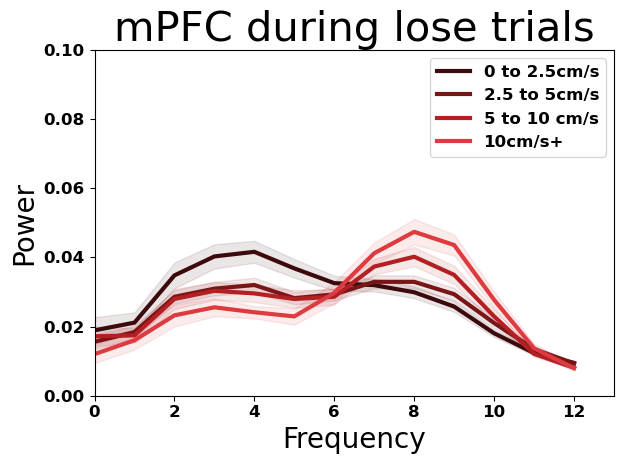

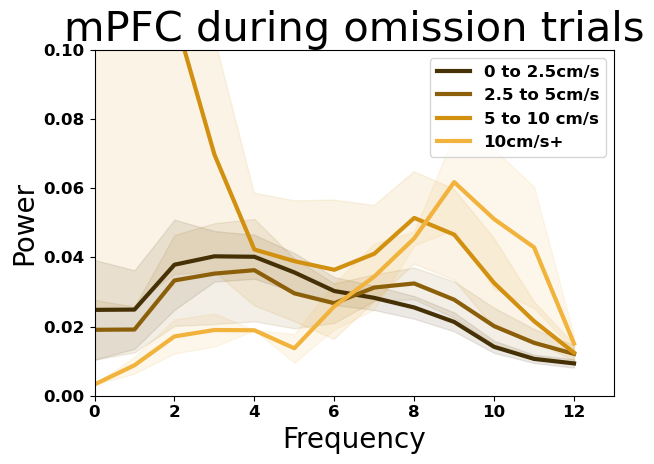

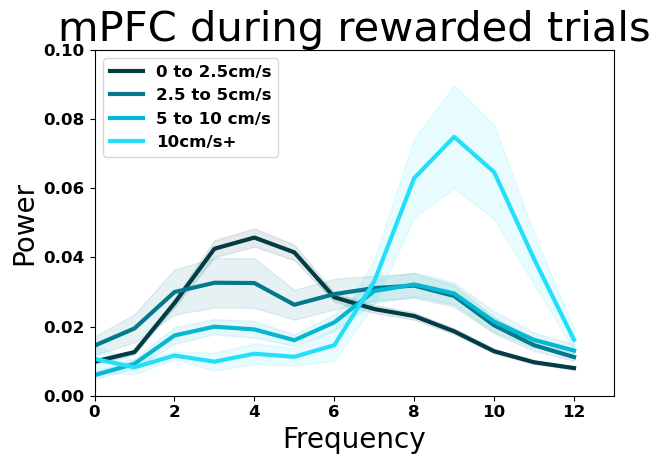

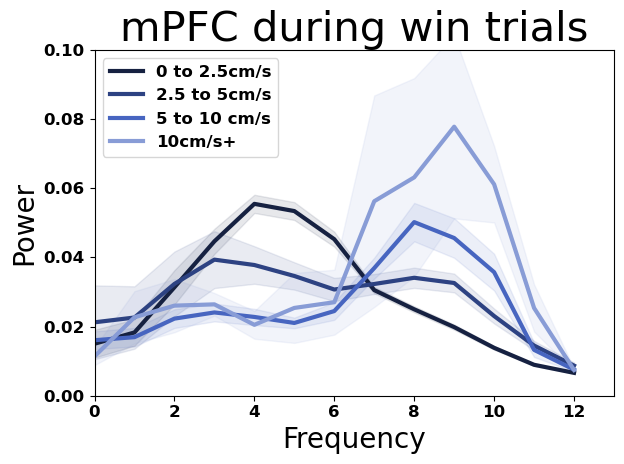

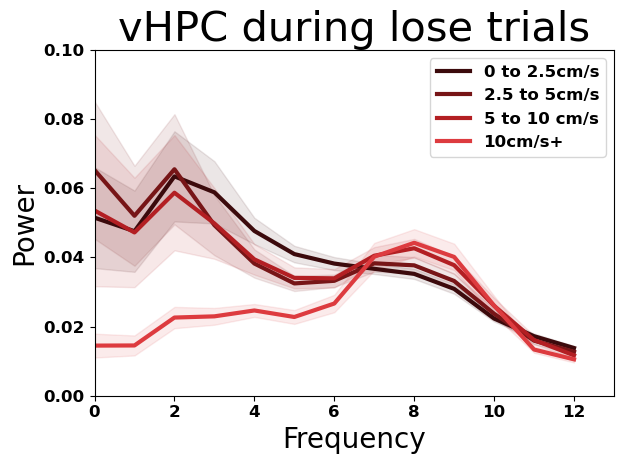

...

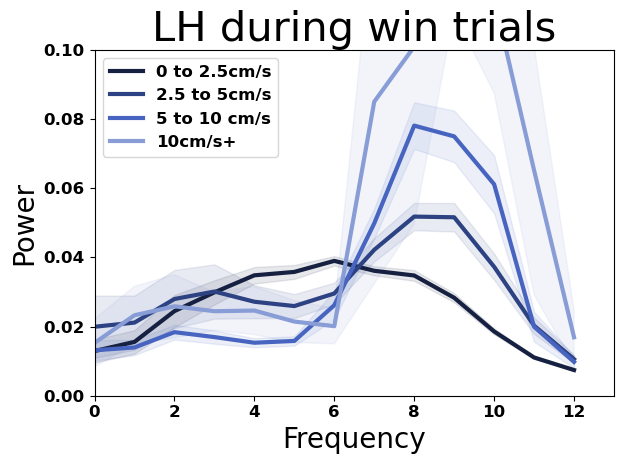

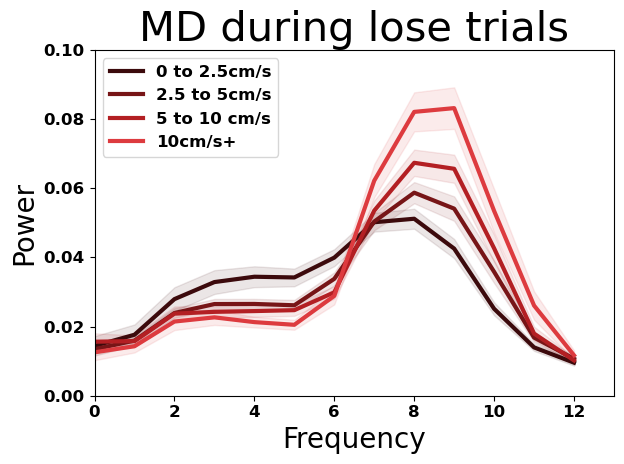

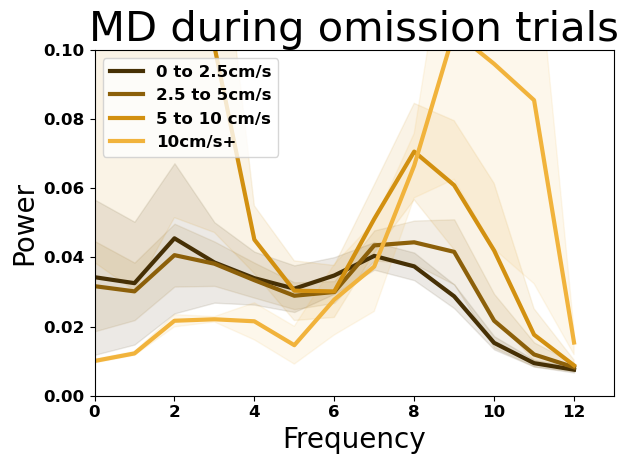

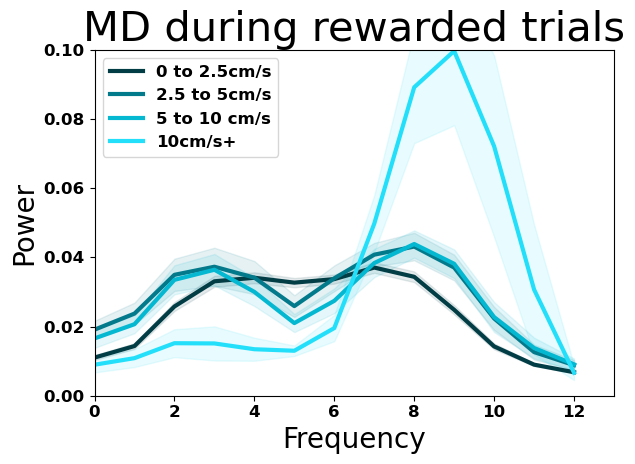

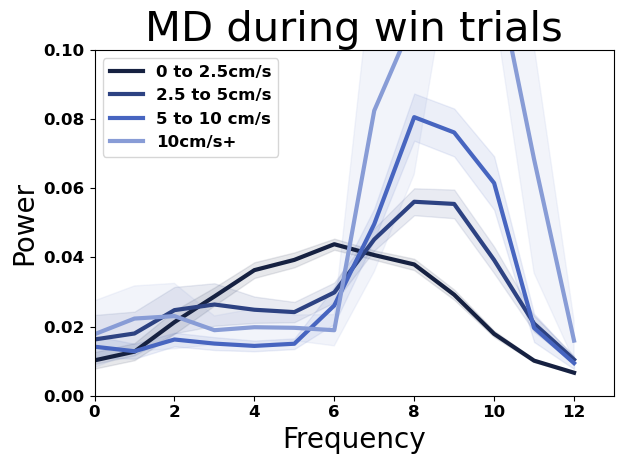

In [64]:
low_freq = 0
high_freq = 13
for region in grouped_all_trials_df["region_and_baseline_or_trial"].unique():
    region_df = grouped_all_trials_df[grouped_all_trials_df["region_and_baseline_or_trial"] == region]

    for outcome in region_df["trial_outcome"].unique():
        fig, ax = plt.subplots()
        plt.title("{} during {} trials".format(region.split("_")[0], outcome), fontsize=30)
        plt.xlabel("Frequency", fontsize=20)
        plt.ylabel("Power", fontsize=20)
        plt.xlim(low_freq, high_freq) 
        # plt.yscale("log")
        plt.ylim(0, 0.1)
        outcome_df = region_df[(region_df["trial_outcome"] == outcome)]
        # Generate gradient colors
        gradient_colors = generate_gradient_colors(OUTCOME_TO_COLOR[outcome], 20)
        
        for index, row in outcome_df.iterrows():           
            current_frequencies = ALL_FREQUENCIES[low_freq: high_freq]
            mean_power = row["mean_power"][low_freq: high_freq]
            sem_power = row["sem_power"][low_freq: high_freq]
                
            
            try:
                ax = sns.lineplot(x=current_frequencies, y=mean_power, \
                label="{}".format(BIN_TO_VELOCITY[row["velocity_bin"]]), linewidth=3, color=gradient_colors[-(row["velocity_bin"]+1) *4])
                
                plt.fill_between(current_frequencies, 
                mean_power - sem_power, mean_power + sem_power, \
                alpha=0.1, color=gradient_colors[-(row["velocity_bin"]+1) *4])
            
            except Exception as e: 
                print(e)
                continue
                
        plt.legend()
        plt.tight_layout()
        plt.savefig("./proc/velocity_parsed_power/rce_velocity_parsed_lfp_power_freq_{}_to_{}_region_{}_{}.png".format(low_freq, high_freq, region.split("_")[0], outcome))

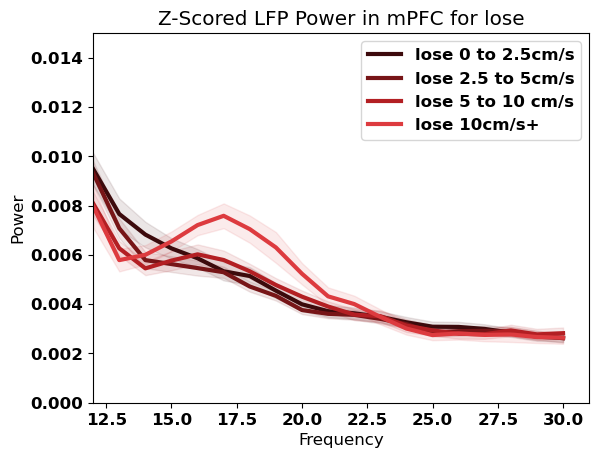

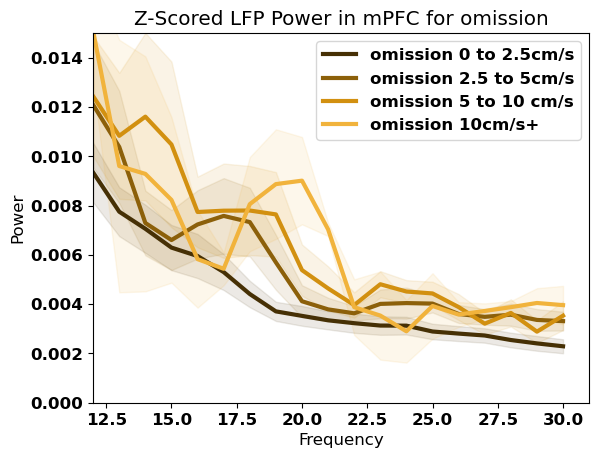

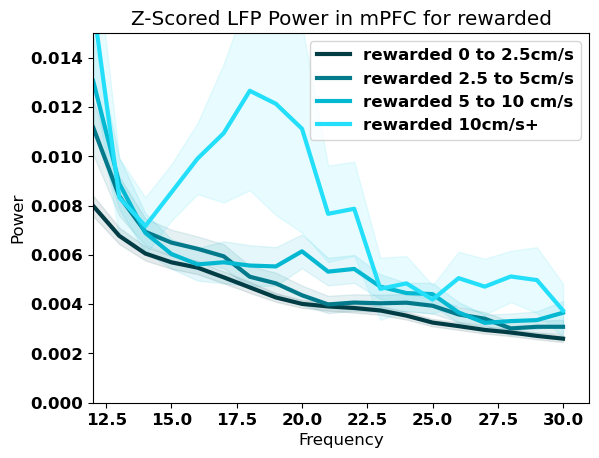

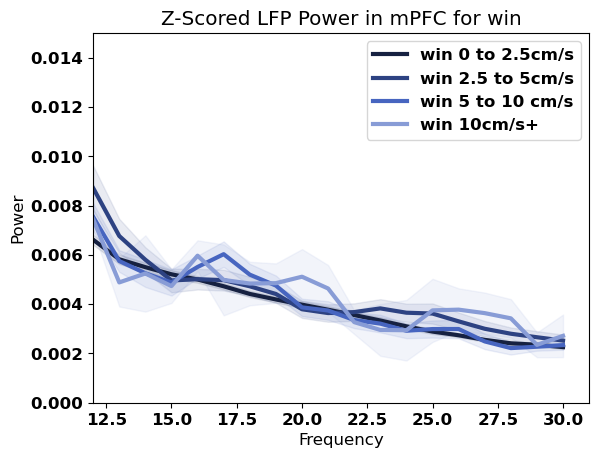

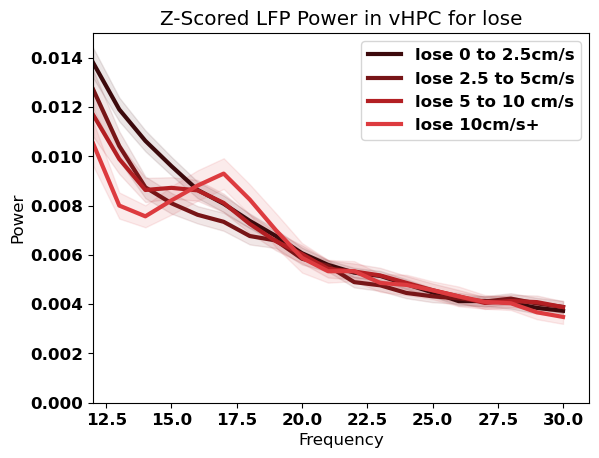

...

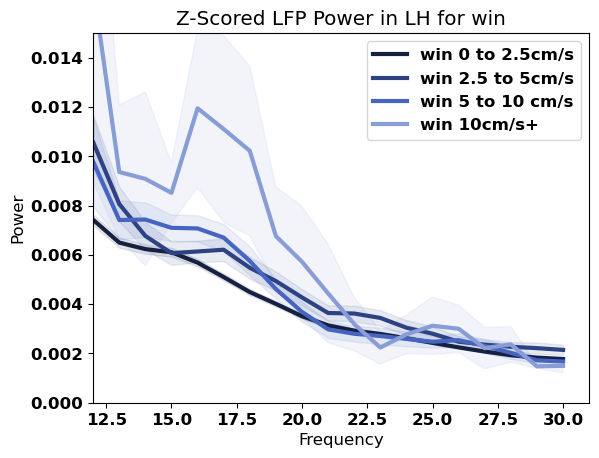

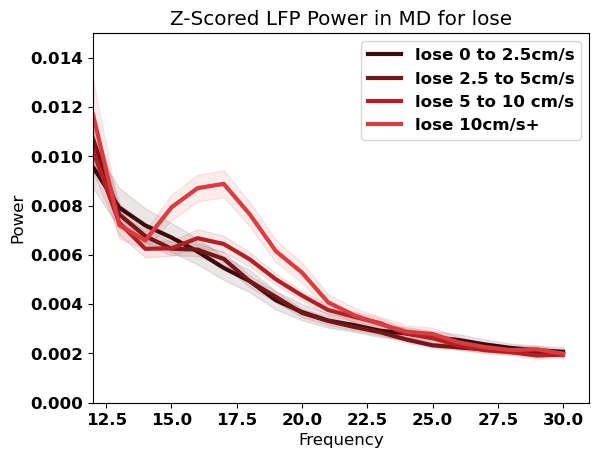

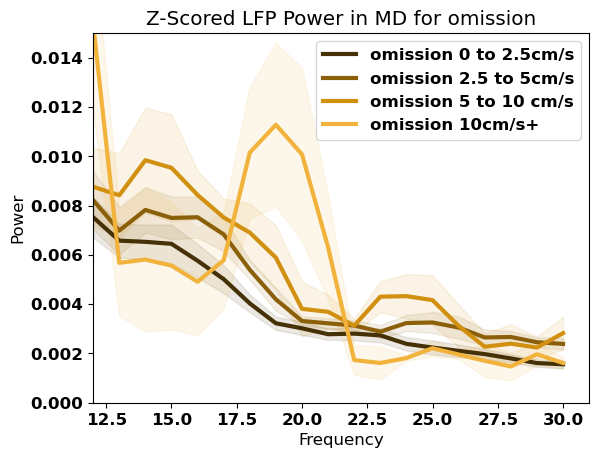

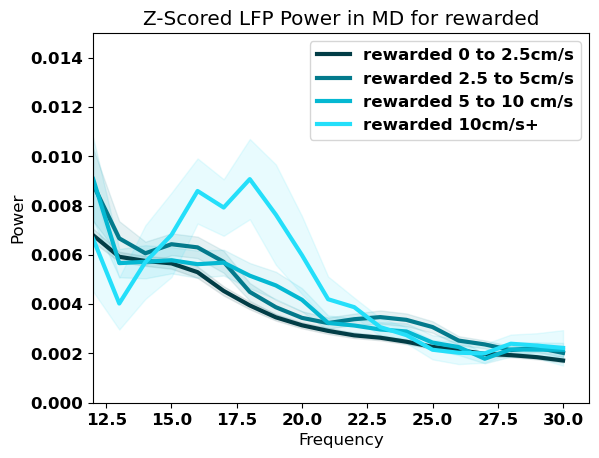

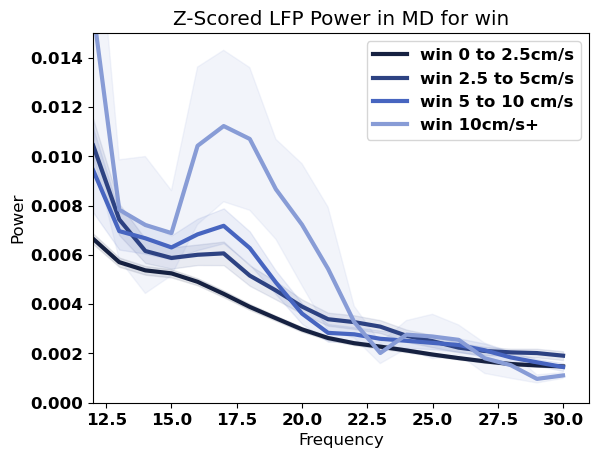

In [65]:
low_freq = 12
high_freq = 31
for region in grouped_all_trials_df["region_and_baseline_or_trial"].unique():
    region_df = grouped_all_trials_df[grouped_all_trials_df["region_and_baseline_or_trial"] == region]

    for outcome in region_df["trial_outcome"].unique():
        fig, ax = plt.subplots()
        plt.title("Z-Scored LFP Power in {} for {}".format(region.split("_")[0], outcome))
        plt.xlabel("Frequency")
        plt.ylabel("Power")
        plt.xlim(low_freq, high_freq) 
        # plt.yscale("log")
        plt.ylim(0, 0.015)
        
        outcome_df = region_df[(region_df["trial_outcome"] == outcome)]
        # Generate gradient colors
        gradient_colors = generate_gradient_colors(OUTCOME_TO_COLOR[outcome], 20)
        
        for index, row in outcome_df.iterrows():           
            current_frequencies = ALL_FREQUENCIES[low_freq: high_freq]
            mean_power = row["mean_power"][low_freq: high_freq]
            sem_power = row["sem_power"][low_freq: high_freq]
                
            
            try:
                ax = sns.lineplot(x=current_frequencies, y=mean_power, \
                label="{} {}".format(outcome, BIN_TO_VELOCITY[row["velocity_bin"]]), linewidth=3, color=gradient_colors[-(row["velocity_bin"]+1) *4])
                
                plt.fill_between(current_frequencies, 
                mean_power - sem_power, mean_power + sem_power, \
                alpha=0.1, color=gradient_colors[-(row["velocity_bin"]+1) *4])
            
            except Exception as e: 
                print(e)
                continue
        plt.legend()
        plt.savefig("./proc/velocity_parsed_power/rce_velocity_parsed_lfp_power_freq_{}_to_{}_region_{}_{}.png".format(low_freq, high_freq, region.split("_")[0], outcome))

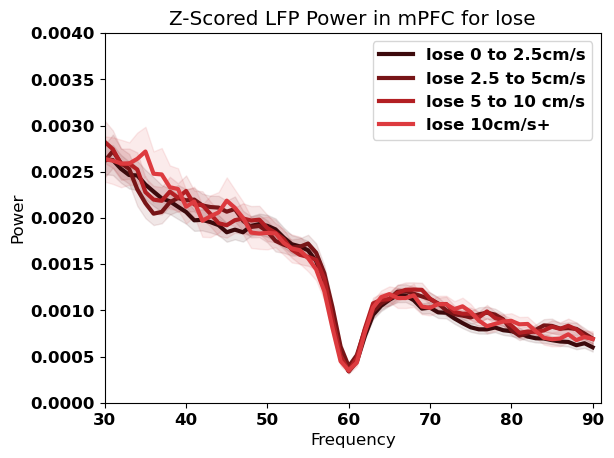

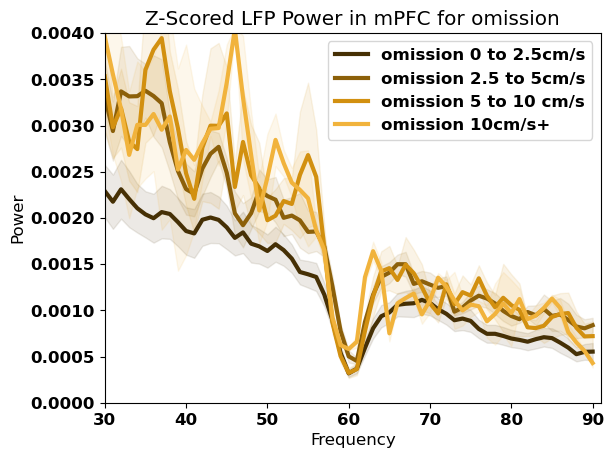

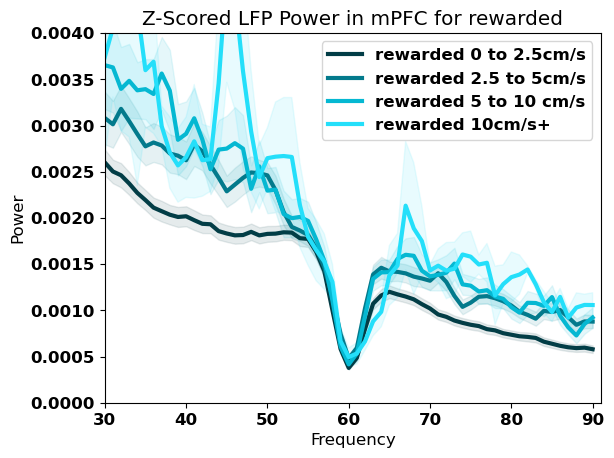

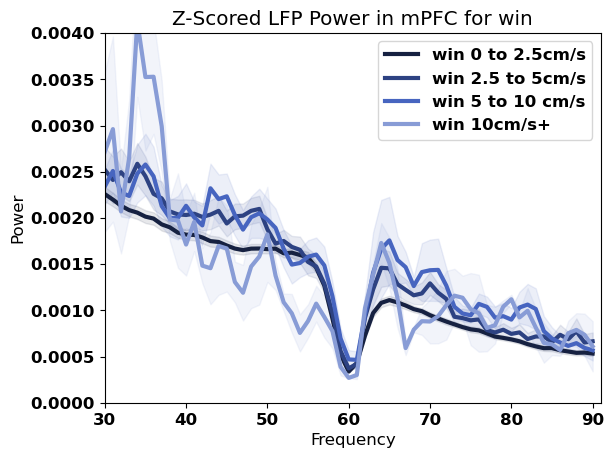

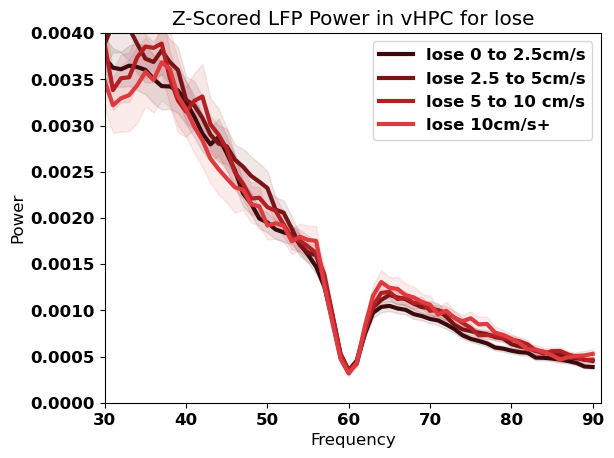

...

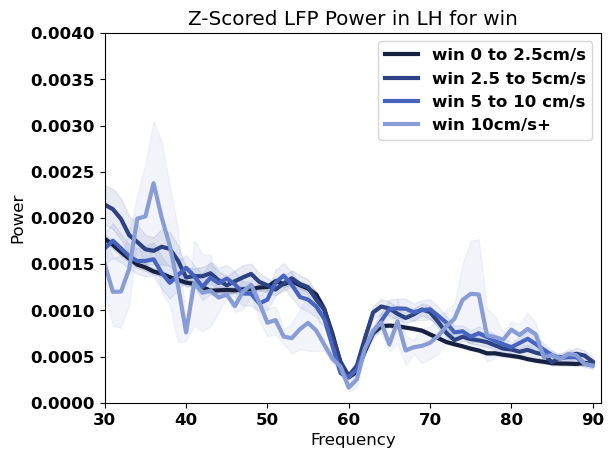

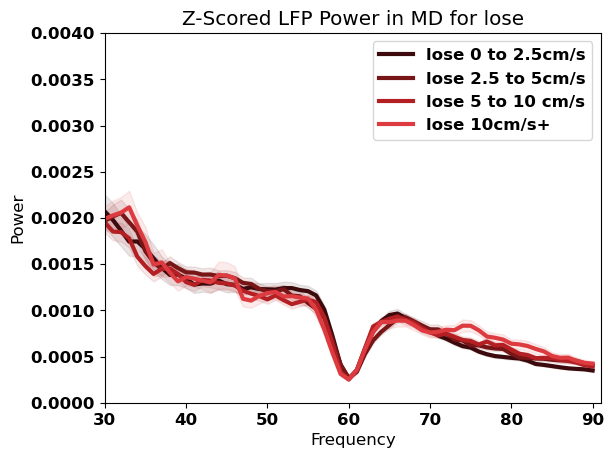

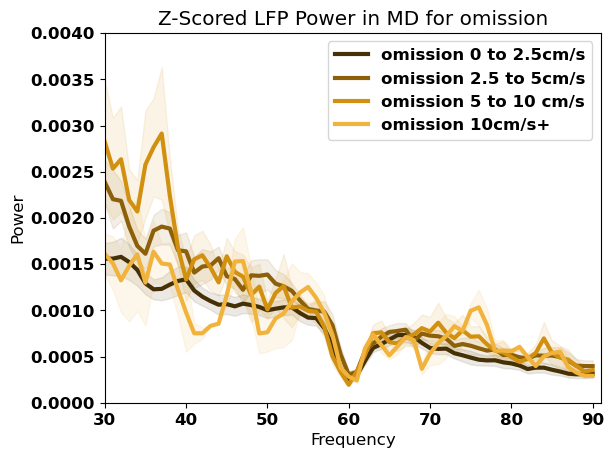

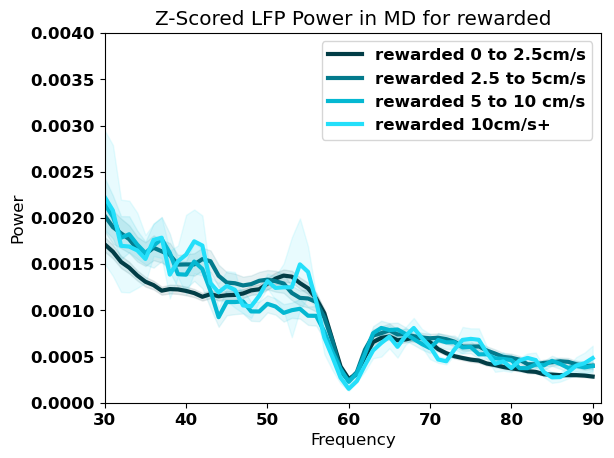

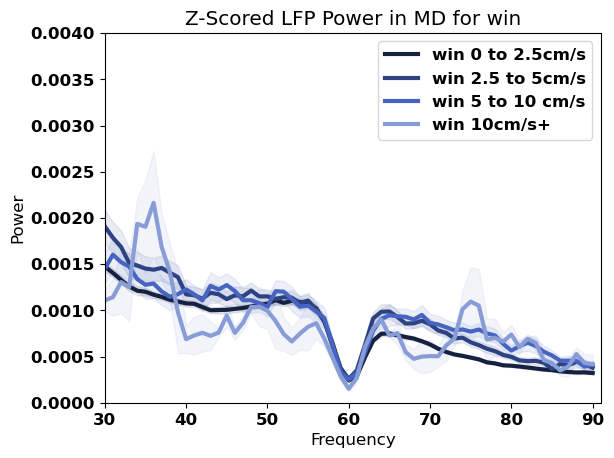

In [66]:
low_freq = 30
high_freq = 91
for region in grouped_all_trials_df["region_and_baseline_or_trial"].unique():
    region_df = grouped_all_trials_df[grouped_all_trials_df["region_and_baseline_or_trial"] == region]

    for outcome in region_df["trial_outcome"].unique():
        fig, ax = plt.subplots()
        plt.title("Z-Scored LFP Power in {} for {}".format(region.split("_")[0], outcome))
        plt.xlabel("Frequency")
        plt.ylabel("Power")
        plt.xlim(low_freq, high_freq) 
        # plt.yscale("log")
        plt.ylim(0, 0.004)
        outcome_df = region_df[(region_df["trial_outcome"] == outcome)]
        # Generate gradient colors
        gradient_colors = generate_gradient_colors(OUTCOME_TO_COLOR[outcome], 20)
        
        for index, row in outcome_df.iterrows():           
            current_frequencies = ALL_FREQUENCIES[low_freq: high_freq]
            mean_power = row["mean_power"][low_freq: high_freq]
            sem_power = row["sem_power"][low_freq: high_freq]
                
            
            try:
                ax = sns.lineplot(x=current_frequencies, y=mean_power, \
                label="{} {}".format(outcome, BIN_TO_VELOCITY[row["velocity_bin"]]), linewidth=3, color=gradient_colors[-(row["velocity_bin"]+1) *4])
                
                plt.fill_between(current_frequencies, 
                mean_power - sem_power, mean_power + sem_power, \
                alpha=0.1, color=gradient_colors[-(row["velocity_bin"]+1) *4])
            
            except Exception as e: 
                print(e)
                continue
        plt.legend()
        plt.savefig("./proc/velocity_parsed_power/rce_velocity_parsed_lfp_power_freq_{}_to_{}_region_{}_{}.png".format(low_freq, high_freq, region.split("_")[0], outcome))

# Plotting be velocity

In [67]:
grouped_all_trials_df = VELCOITY_PARSED_MERGED_LFP_AND_SLEAP.groupby(['velocity_bin']).agg({k: lambda x: np.vstack([arr for arr in x.tolist() if not np.any(np.isnan(arr))]) for k in window_averaged_power_columns}).reset_index()

In [68]:
grouped_all_trials_df = pd.melt(grouped_all_trials_df, id_vars =['velocity_bin'], value_vars =grouped_all_trials_df.drop(columns=["velocity_bin"]).columns, value_name="power", var_name="region_and_baseline_or_trial") 

In [69]:
grouped_all_trials_df.head()

,velocity_bin,region_and_baseline_or_trial,power
0,0,mPFC_baseline_velocity_parsed_window_averaged_...,"[[0.01184616737558653, 0.012770974589945925, 0..."
1,1,mPFC_baseline_velocity_parsed_window_averaged_...,"[[0.026383808857725656, 0.026588256760259034, ..."
2,2,mPFC_baseline_velocity_parsed_window_averaged_...,"[[0.01233082977460541, 0.013362115039107194, 0..."
3,3,mPFC_baseline_velocity_parsed_window_averaged_...,"[[0.0038768893574110865, 0.008629295082327591,..."
4,0,vHPC_baseline_velocity_parsed_window_averaged_...,"[[0.009499560274665666, 0.014429973866407146, ..."


In [70]:
grouped_all_trials_df["brain_region"] = grouped_all_trials_df["region_and_baseline_or_trial"].apply(lambda x: x.split("_")[0].strip())

In [71]:
grouped_all_trials_df["trial_or_baseline"] = grouped_all_trials_df["region_and_baseline_or_trial"].apply(lambda x: x.split("_")[1].strip())

In [72]:
grouped_all_trials_df["mean_power"] = grouped_all_trials_df["power"].apply(lambda x: np.nanmean(np.vstack(x), axis=0))

In [73]:
grouped_all_trials_df["std_power"] = grouped_all_trials_df["power"].apply(lambda x: np.nanstd(np.vstack(x), axis=0))

In [74]:
grouped_all_trials_df["n_trials"] = grouped_all_trials_df["power"].apply(lambda x: np.sum(~np.isnan(x), axis=0))

In [75]:
grouped_all_trials_df["sem_power"] = grouped_all_trials_df.apply(lambda x: x["std_power"] / np.sqrt(x["n_trials"]), axis=1)

In [76]:
grouped_all_trials_df.head()

,velocity_bin,region_and_baseline_or_trial,power,brain_region,trial_or_baseline,mean_power,std_power,n_trials,sem_power
0,0,mPFC_baseline_velocity_parsed_window_averaged_...,"[[0.01184616737558653, 0.012770974589945925, 0...",mPFC,baseline,"[0.01716372531462785, 0.02110468707363111, 0.0...","[0.04986926752840488, 0.0479476439271664, 0.05...","[274, 274, 274, 274, 274, 274, 274, 274, 274, ...","[0.0030127126292102575, 0.0028966231019529713,..."
1,1,mPFC_baseline_velocity_parsed_window_averaged_...,"[[0.026383808857725656, 0.026588256760259034, ...",mPFC,baseline,"[0.0253289921217797, 0.028111581323687847, 0.0...","[0.1393977752967519, 0.14096781053660618, 0.14...","[191, 191, 191, 191, 191, 191, 191, 191, 191, ...","[0.010086469023898894, 0.01020007278679617, 0...."
2,2,mPFC_baseline_velocity_parsed_window_averaged_...,"[[0.01233082977460541, 0.013362115039107194, 0...",mPFC,baseline,"[0.04244500688407389, 0.042694920173586885, 0....","[0.32249844233983127, 0.2974572742253824, 0.28...","[130, 130, 130, 130, 130, 130, 130, 130, 130, ...","[0.02828498450681746, 0.02608872877605817, 0.0..."
3,3,mPFC_baseline_velocity_parsed_window_averaged_...,"[[0.0038768893574110865, 0.008629295082327591,...",mPFC,baseline,"[0.011824309896233318, 0.014455155112240393, 0...","[0.014529483712178158, 0.011752033464352192, 0...","[59, 59, 59, 59, 59, 59, 59, 59, 59, 59, 59, 5...","[0.0018915776616020925, 0.0015299844385342108,..."
4,0,vHPC_baseline_velocity_parsed_window_averaged_...,"[[0.009499560274665666, 0.014429973866407146, ...",vHPC,baseline,"[0.030154301668804555, 0.0313168693344549, 0.0...","[0.09435696010981681, 0.08298823281193031, 0.0...","[274, 274, 274, 274, 274, 274, 274, 274, 274, ...","[0.005700312426181454, 0.005013502492811542, 0..."


# Drawing all velocity bins together for each trial outcome

In [77]:
OUTCOME_TO_COLOR

{'lose': '#951a1d',
 'omission': '#af780d',
 'rewarded': '#0499af',
 'win': '#3853a3'}

In [78]:
grouped_all_trials_df.head()

,velocity_bin,region_and_baseline_or_trial,power,brain_region,trial_or_baseline,mean_power,std_power,n_trials,sem_power
0,0,mPFC_baseline_velocity_parsed_window_averaged_...,"[[0.01184616737558653, 0.012770974589945925, 0...",mPFC,baseline,"[0.01716372531462785, 0.02110468707363111, 0.0...","[0.04986926752840488, 0.0479476439271664, 0.05...","[274, 274, 274, 274, 274, 274, 274, 274, 274, ...","[0.0030127126292102575, 0.0028966231019529713,..."
1,1,mPFC_baseline_velocity_parsed_window_averaged_...,"[[0.026383808857725656, 0.026588256760259034, ...",mPFC,baseline,"[0.0253289921217797, 0.028111581323687847, 0.0...","[0.1393977752967519, 0.14096781053660618, 0.14...","[191, 191, 191, 191, 191, 191, 191, 191, 191, ...","[0.010086469023898894, 0.01020007278679617, 0...."
2,2,mPFC_baseline_velocity_parsed_window_averaged_...,"[[0.01233082977460541, 0.013362115039107194, 0...",mPFC,baseline,"[0.04244500688407389, 0.042694920173586885, 0....","[0.32249844233983127, 0.2974572742253824, 0.28...","[130, 130, 130, 130, 130, 130, 130, 130, 130, ...","[0.02828498450681746, 0.02608872877605817, 0.0..."
3,3,mPFC_baseline_velocity_parsed_window_averaged_...,"[[0.0038768893574110865, 0.008629295082327591,...",mPFC,baseline,"[0.011824309896233318, 0.014455155112240393, 0...","[0.014529483712178158, 0.011752033464352192, 0...","[59, 59, 59, 59, 59, 59, 59, 59, 59, 59, 59, 5...","[0.0018915776616020925, 0.0015299844385342108,..."
4,0,vHPC_baseline_velocity_parsed_window_averaged_...,"[[0.009499560274665666, 0.014429973866407146, ...",vHPC,baseline,"[0.030154301668804555, 0.0313168693344549, 0.0...","[0.09435696010981681, 0.08298823281193031, 0.0...","[274, 274, 274, 274, 274, 274, 274, 274, 274, ...","[0.005700312426181454, 0.005013502492811542, 0..."


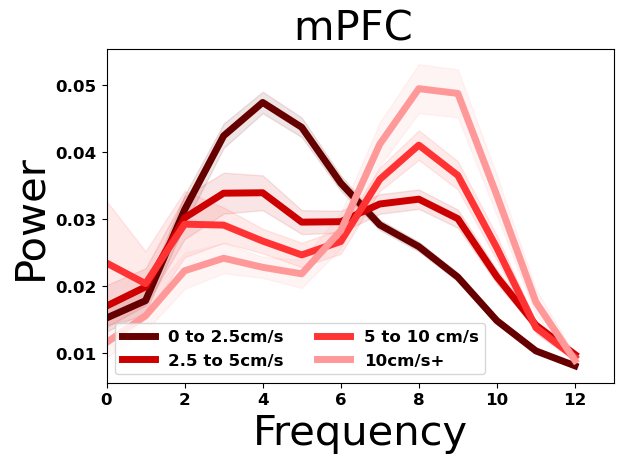

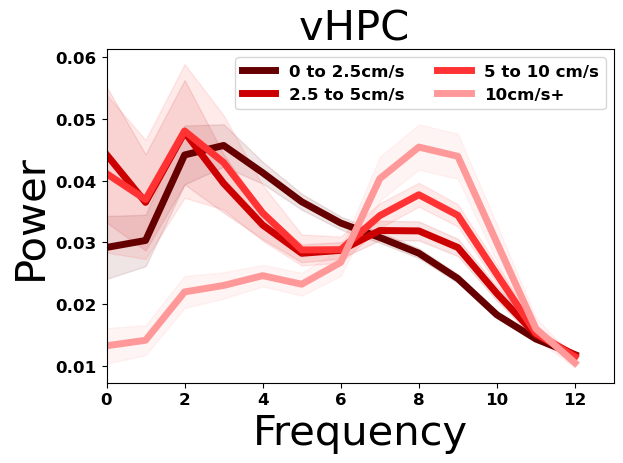

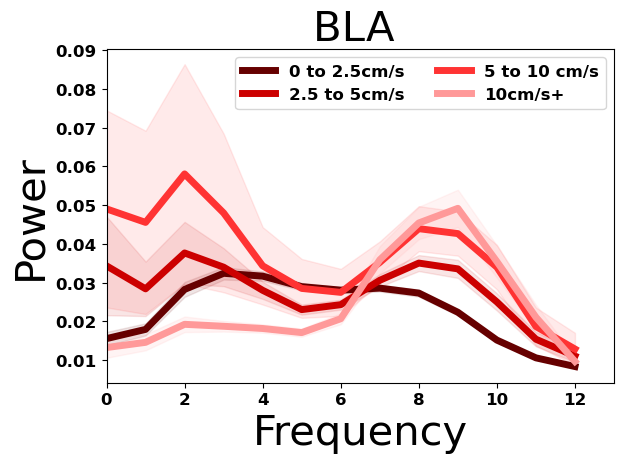

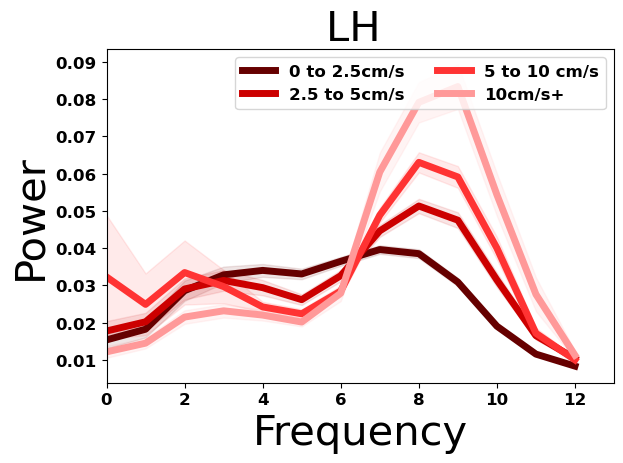

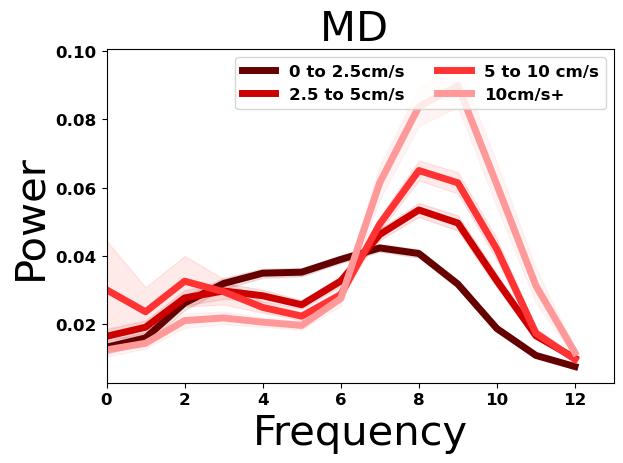

In [79]:
low_freq = 0
high_freq = 13
for region in grouped_all_trials_df["brain_region"].unique():
    region_df = grouped_all_trials_df[(grouped_all_trials_df["brain_region"] == region) & (grouped_all_trials_df["trial_or_baseline"] == "trial")]

    fig, ax = plt.subplots()
    plt.title("{} ".format(region.split("_")[0]), fontsize=30)
    plt.xlabel("Frequency", fontsize=30)
    plt.ylabel("Power", fontsize=30)
    plt.xlim(low_freq, high_freq) 
    # plt.yscale("log")
    
    # Generate gradient colors
    gradient_colors = generate_gradient_colors("red", 20)
    
    for index, row in region_df.iterrows():           

        current_frequencies = ALL_FREQUENCIES[low_freq: high_freq]
        mean_power = row["mean_power"][low_freq: high_freq]
        sem_power = row["sem_power"][low_freq: high_freq]
            
        
        try:
            ax = sns.lineplot(x=current_frequencies, y=mean_power, \
            label="{}".format(BIN_TO_VELOCITY[row["velocity_bin"]]), linewidth=5, color=gradient_colors[-(row["velocity_bin"]+1) *4])
            
            plt.fill_between(current_frequencies, 
            mean_power - sem_power, mean_power + sem_power, \
            alpha=0.1, color=gradient_colors[-(row["velocity_bin"]+1) *4])
        
        except Exception as e: 
            print(e)
            continue
    plt.tight_layout()
    plt.legend(ncol=2)
    plt.savefig("./proc/velocity_parsed_power/rce_velocity_parsed_lfp_power_freq_{}_to_{}_region_{}.png".format(low_freq, high_freq, region.split("_")[0]))

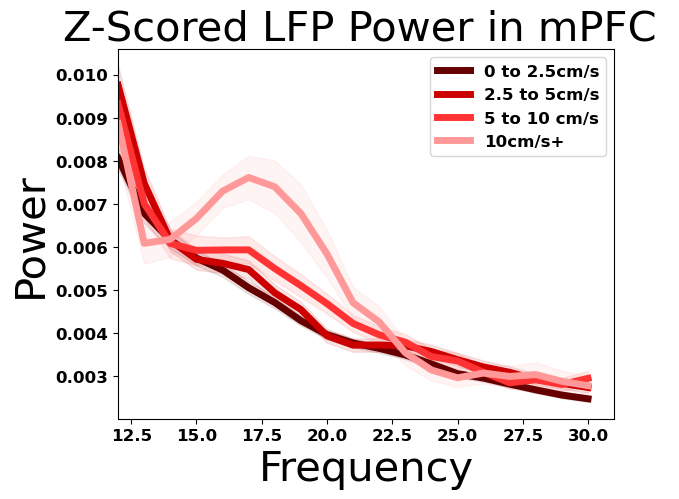

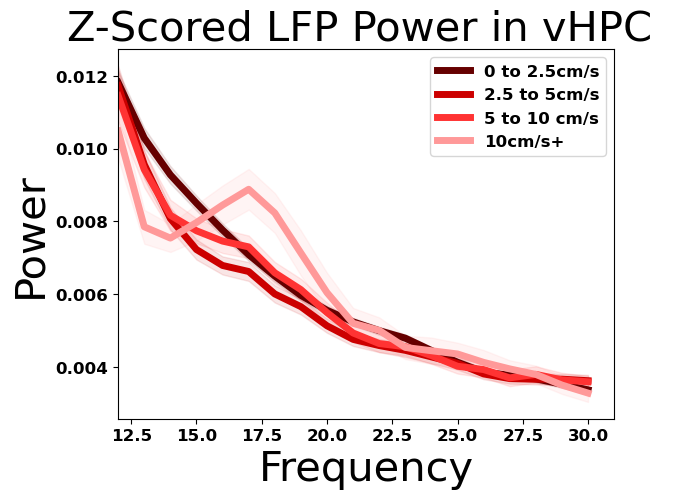

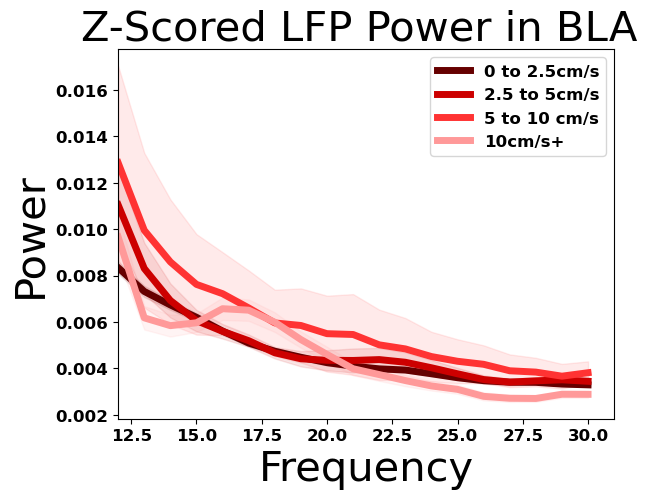

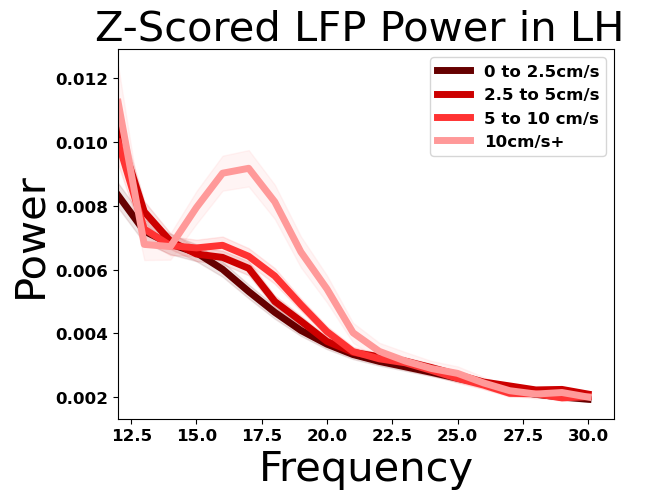

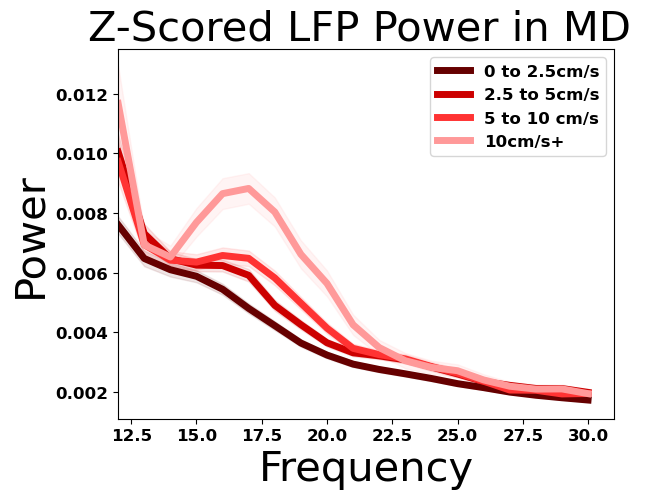

In [80]:
low_freq = 12
high_freq = 31
for region in grouped_all_trials_df["brain_region"].unique():
    region_df = grouped_all_trials_df[(grouped_all_trials_df["brain_region"] == region) & (grouped_all_trials_df["trial_or_baseline"] == "trial")]

    fig, ax = plt.subplots()
    plt.title("Z-Scored LFP Power in {} ".format(region.split("_")[0]), fontsize=30)
    plt.xlabel("Frequency", fontsize=30)
    plt.ylabel("Power", fontsize=30)
    plt.xlim(low_freq, high_freq) 
    # plt.yscale("log")
    
    # Generate gradient colors
    gradient_colors = generate_gradient_colors("red", 20)
    
    for index, row in region_df.iterrows():           

        current_frequencies = ALL_FREQUENCIES[low_freq: high_freq]
        mean_power = row["mean_power"][low_freq: high_freq]
        sem_power = row["sem_power"][low_freq: high_freq]
            
        
        try:
            ax = sns.lineplot(x=current_frequencies, y=mean_power, \
            label="{}".format(BIN_TO_VELOCITY[row["velocity_bin"]]), linewidth=5, color=gradient_colors[-(row["velocity_bin"]+1) *4])
            
            plt.fill_between(current_frequencies, 
            mean_power - sem_power, mean_power + sem_power, \
            alpha=0.1, color=gradient_colors[-(row["velocity_bin"]+1) *4])
        
        except Exception as e: 
            print(e)
            continue
    plt.legend()
    plt.savefig("./proc/velocity_parsed_power/rce_velocity_parsed_lfp_power_freq_{}_to_{}_region_{}.png".format(low_freq, high_freq, region.split("_")[0]))

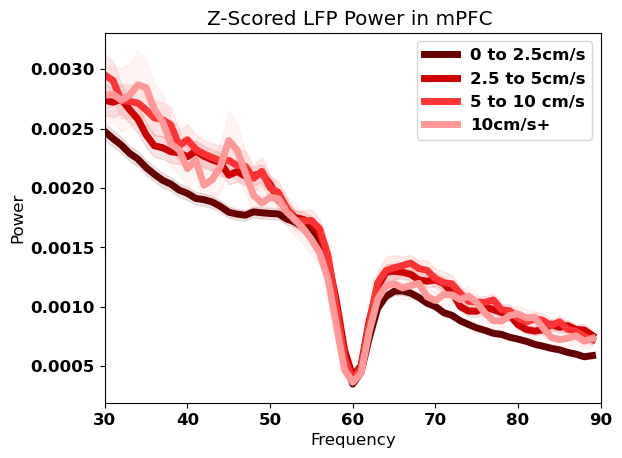

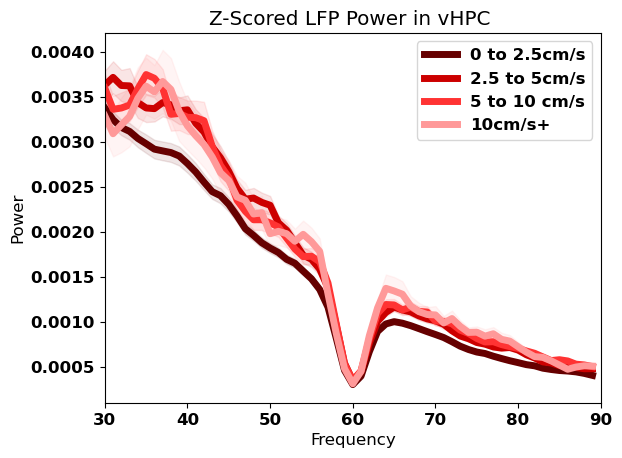

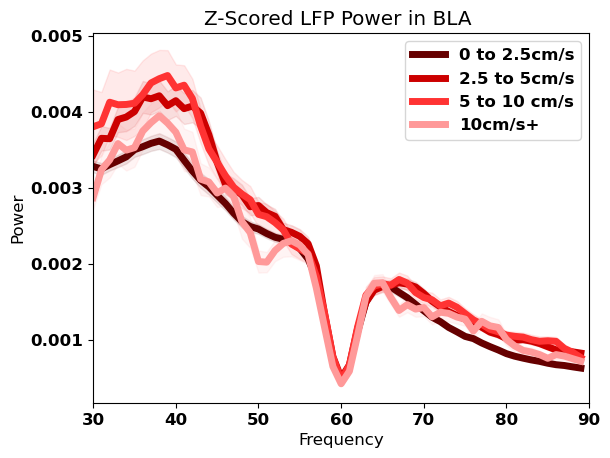

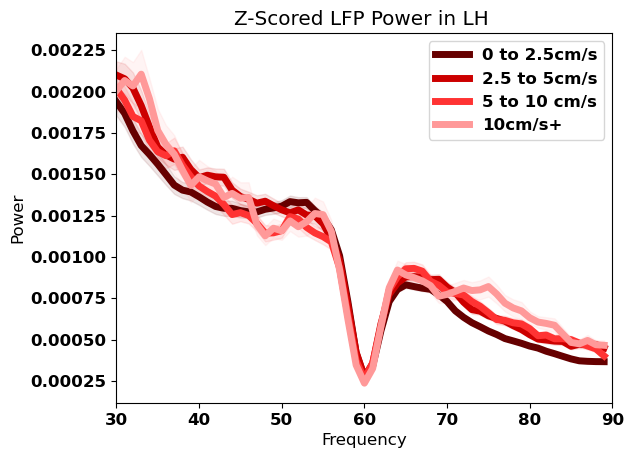

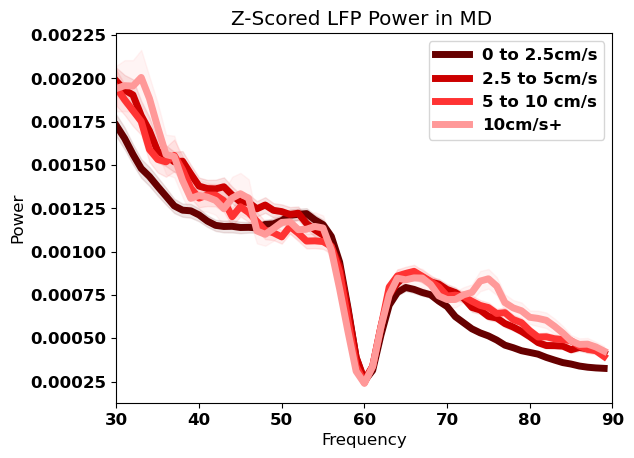

In [81]:
low_freq = 30
high_freq = 90
for region in grouped_all_trials_df["brain_region"].unique():
    region_df = grouped_all_trials_df[(grouped_all_trials_df["brain_region"] == region) & (grouped_all_trials_df["trial_or_baseline"] == "trial")]

    fig, ax = plt.subplots()
    plt.title("Z-Scored LFP Power in {} ".format(region.split("_")[0]))
    plt.xlabel("Frequency")
    plt.ylabel("Power")
    plt.xlim(low_freq, high_freq) 
    # plt.yscale("log")
    
    # Generate gradient colors
    gradient_colors = generate_gradient_colors("red", 20)
    
    for index, row in region_df.iterrows():           

        current_frequencies = ALL_FREQUENCIES[low_freq: high_freq]
        mean_power = row["mean_power"][low_freq: high_freq]
        sem_power = row["sem_power"][low_freq: high_freq]
            
        
        try:
            ax = sns.lineplot(x=current_frequencies, y=mean_power, \
            label="{}".format(BIN_TO_VELOCITY[row["velocity_bin"]]), linewidth=5, color=gradient_colors[-(row["velocity_bin"]+1) *4])
            
            plt.fill_between(current_frequencies, 
            mean_power - sem_power, mean_power + sem_power, \
            alpha=0.1, color=gradient_colors[-(row["velocity_bin"]+1) *4])
        
        except Exception as e: 
            print(e)
            continue
    plt.legend()
    plt.savefig("./proc/velocity_parsed_power/rce_velocity_parsed_lfp_power_freq_{}_to_{}_region_{}.png".format(low_freq, high_freq, region.split("_")[0]))

# Parse power by lower velocity

In [82]:
MERGED_LFP_AND_SLEAP.head()

,time,recording_file,video_number,current_subject,mPFC_baseline_lfp_trace,mPFC_trial_lfp_trace,vHPC_baseline_lfp_trace,vHPC_trial_lfp_trace,BLA_baseline_lfp_trace,BLA_trial_lfp_trace,...,mPFC_baseline_all_window_averaged_power,vHPC_baseline_all_window_averaged_power,BLA_baseline_all_window_averaged_power,LH_baseline_all_window_averaged_power,MD_baseline_all_window_averaged_power,mPFC_trial_all_window_averaged_power,vHPC_trial_all_window_averaged_power,BLA_trial_all_window_averaged_power,LH_trial_all_window_averaged_power,MD_trial_all_window_averaged_power
0,30950500,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[-0.33054966, -0.41988742, -0.9134785, -1.4964...","[0.51145864, 0.29928145, 0.22111093, 0.1116721...","[0.27216667, -0.26033333, -0.8307, -1.0484333,...","[-1.1513833, -1.1845167, -1.14665, -1.1431, -1...","[-0.6486342, -0.79189086, -1.2833407, -1.73499...","[-0.44369763, -0.31436872, 0.01790708, 0.39395...",...,"[0.01579940523904916, 0.0165626647529655, 0.02...","[0.007338252748333259, 0.01089563666395944, 0....","[0.013091607841038322, 0.014117608416465038, 0...","[0.022964455789557244, 0.022290898817971163, 0...","[0.02557420165245759, 0.026540399430798854, 0....","[0.013578532216685993, 0.01736326663715145, 0....","[0.005884176938003947, 0.01262773509768471, 0....","[0.016782418918595676, 0.015240122116290227, 0...","[0.03241093477294236, 0.03003938250305729, 0.0...","[0.02394606557277414, 0.024972355567400052, 0...."
1,32550496,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[1.1479901, 1.0943874, 1.0251507, 0.8330745, 0...","[0.32384935, 0.1630414, 0.0044668876, 0.062536...","[1.9016167, 2.1146166, 2.2791, 2.3856, 2.43056...","[-1.0224, -0.9159, -0.9963667, -0.9774333, -0....","[0.85755014, 0.8535708, 0.83964306, 0.93116814...","[1.1042699, 0.9152507, 0.29447198, -0.3024307,...",...,"[0.01043973810516993, 0.011995901256217315, 0....","[0.006520190897142798, 0.009908554975019851, 0...","[0.006274318131038264, 0.00691078513224769, 0....","[0.01052940561515397, 0.011517583637301586, 0....","[0.013189469018915191, 0.012605535448486686, 0...","[0.005072513655663902, 0.0071730776351884, 0.0...","[0.017807810758419772, 0.02051735783988241, 0....","[0.0075150800916258895, 0.012030467854449603, ...","[0.003644272984766944, 0.005808118645131345, 0...","[0.006489759161394153, 0.007582477136466669, 0..."
2,34350494,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[-0.23897848, 0.36181787, 0.122839406, -0.1474...","[-0.14964072, 0.4355215, 0.6074967, 0.317149, ...","[-1.0034667, -0.7076333, -0.69816667, -0.67923...","[0.48753333, 0.355, 0.19643334, 0.18696667, 0....","[-1.1341151, -0.62276846, -0.70235544, -0.6844...","[-0.51532596, 0.051731564, 0.16713275, 0.09152...",...,"[0.005078069620033379, 0.007847947527141026, 0...","[0.013600617428570527, 0.019533499354359572, 0...","[0.006141355758002356, 0.009303619594021637, 0...","[0.007468537947027687, 0.010884286729309219, 0...","[0.004814152657455484, 0.006184218967929381, 0...","[0.01043389231412404, 0.011229291113011746, 0....","[0.018798404711232963, 0.024949532187259045, 0...","[0.009525639680784495, 0.010941343792716796, 0...","[0.016095087975310174, 0.015224296452442521, 0...","[0.011809376046566988, 0.010816138136563104, 0..."
3,35950496,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[0.49582452, 0.18537582, 0.4042533, 0.24344537...","[-0.33948344, 0.01786755, 0.13624007, -0.12060...","[0.6023167, 0.48398334, 0.22601667, 0.04496666...","[0.1704, 0.059166666, -0.13845, -0.35026667, -...","[0.029845133, -0.6247581, -0.74413866, -0.3820...","[-1.1639602, -1.1440635, -1.1201873, -1.038610...",...,"[0.008870300252232993, 0.009661322703319016, 0...","[0.01636629887281683, 0.024804479917894477, 0....","[0.00689989260430601, 0.009437438029868149, 0....","[0.010951516062517489, 0.010717930878165088, 0...","[0.008629680530200008, 0.008992947836672616, 0...","[0.006360855718027482, 0.007822405773560855, 0...","[0.0164348816792982, 0.02

In [83]:

MERGED_LFP_AND_SLEAP["binned_trial_velocity_mask"] = MERGED_LFP_AND_SLEAP["trial_chunked_thorax_velocity"].apply(lambda x: [index for index, num in enumerate(x) if MIN_VELOCITY <= num <= MAX_VELOCITY])

MERGED_LFP_AND_SLEAP["binned_baseline_velocity_mask"] = MERGED_LFP_AND_SLEAP["binned_baseline_thorax_velocity"].apply(lambda x: [index for index, num in enumerate(x) if MIN_VELOCITY <= num <= MAX_VELOCITY])

for col in baseline_windowed_power_columns:
    region_and_baseline_or_trial = "_".join(col.split("_")[:2])
    MERGED_LFP_AND_SLEAP["{}_velocity_parsed_window_averaged_power".format(region_and_baseline_or_trial)] = MERGED_LFP_AND_SLEAP.apply(lambda x: np.nanmean(np.array([x[col][i] for i in x["binned_baseline_velocity_mask"]]), axis=0), axis=1)

for col in trial_windowed_power_columns:
    region_and_baseline_or_trial = "_".join(col.split("_")[:2])
    MERGED_LFP_AND_SLEAP["{}_velocity_parsed_window_averaged_power".format(region_and_baseline_or_trial)] = MERGED_LFP_AND_SLEAP.apply(lambda x: np.nanmean(np.array([x[col][i] for i in x["binned_trial_velocity_mask"]]), axis=0), axis=1)



In [84]:
for col in MERGED_LFP_AND_SLEAP.columns:
    print(col)

time
recording_file
video_number
current_subject
mPFC_baseline_lfp_trace
mPFC_trial_lfp_trace
vHPC_baseline_lfp_trace
vHPC_trial_lfp_trace
BLA_baseline_lfp_trace
BLA_trial_lfp_trace
LH_baseline_lfp_trace
LH_trial_lfp_trace
MD_baseline_lfp_trace
MD_trial_lfp_trace
recording_dir
time_stamp_index
video_file
video_frame
subject_info
competition_closeness
video_name
all_subjects
trial_outcome
lfp_index
baseline_lfp_timestamp_range
trial_lfp_timestamp_range
baseline_ephys_timestamp_range
trial_ephys_timestamp_range
baseline_videoframe_range
trial_videoframe_range
trial_number
Cohort
spike_interface_mPFC
spike_interface_vHPC
spike_interface_BLA
spike_interface_LH
spike_interface_MD
file_path
start_frame
stop_frame
individual_subj
all_subj
recording_name
track_names
subject_id
corner_path
corner_parts
bottom_width
top_width
right_height
left_height
average_height
average_width
width_ratio
height_ratio
rescaled_locations
box_bottom_left
reward_port
box_top_left
box_top_right
box_bottom_right
ba

# Calculating the velocity parsed average power for each frequency band

In [85]:
BAND_TO_FREQ

{'theta': (6, 11), 'beta': (20, 31), 'gamma': (30, 51)}

In [86]:
velocity_parsed_window_averaged_power_columns = [col for col in MERGED_LFP_AND_SLEAP.columns if "velocity_parsed_window_averaged_power" in col]

In [87]:
velocity_parsed_window_averaged_power_columns

['mPFC_baseline_velocity_parsed_window_averaged_power',
 'vHPC_baseline_velocity_parsed_window_averaged_power',
 'BLA_baseline_velocity_parsed_window_averaged_power',
 'LH_baseline_velocity_parsed_window_averaged_power',
 'MD_baseline_velocity_parsed_window_averaged_power',
 'mPFC_trial_velocity_parsed_window_averaged_power',
 'vHPC_trial_velocity_parsed_window_averaged_power',
 'BLA_trial_velocity_parsed_window_averaged_power',
 'LH_trial_velocity_parsed_window_averaged_power',
 'MD_trial_velocity_parsed_window_averaged_power']

- Removing all trials that have a high velocity trhoguhout

In [88]:
MERGED_LFP_AND_SLEAP = MERGED_LFP_AND_SLEAP[MERGED_LFP_AND_SLEAP["binned_trial_velocity_mask"].map(len) >= 1]

In [89]:
for col in velocity_parsed_window_averaged_power_columns:
    region_base_name = "_".join(col.split("_")[:2])
    print(region_base_name)
    for band, (min_freq, max_freq) in BAND_TO_FREQ.items():
        print(band)
        MERGED_LFP_AND_SLEAP["{}_{}_all_power".format(region_base_name, band)] = MERGED_LFP_AND_SLEAP[col].apply(lambda x: x[min_freq:max_freq])
        MERGED_LFP_AND_SLEAP["{}_{}_mean_power".format(region_base_name, band)] = MERGED_LFP_AND_SLEAP["{}_{}_all_power".format(region_base_name, band)].apply(lambda x: x.mean())

mPFC_baseline
theta
beta
gamma
vHPC_baseline
theta
beta
gamma
BLA_baseline
theta
beta
gamma
LH_baseline
theta
beta
gamma
MD_baseline
theta
beta
gamma
mPFC_trial
theta
beta
gamma
vHPC_trial
theta
beta
gamma
BLA_trial
theta
beta
gamma
LH_trial
theta
beta
gamma
MD_trial
theta
beta
gamma


In [90]:
MERGED_LFP_AND_SLEAP.head()

,time,recording_file,video_number,current_subject,mPFC_baseline_lfp_trace,mPFC_trial_lfp_trace,vHPC_baseline_lfp_trace,vHPC_trial_lfp_trace,BLA_baseline_lfp_trace,BLA_trial_lfp_trace,...,LH_trial_beta_all_power,LH_trial_beta_mean_power,LH_trial_gamma_all_power,LH_trial_gamma_mean_power,MD_trial_theta_all_power,MD_trial_theta_mean_power,MD_trial_beta_all_power,MD_trial_beta_mean_power,MD_trial_gamma_all_power,MD_trial_gamma_mean_power
0,30950500,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[-0.33054966, -0.41988742, -0.9134785, -1.4964...","[0.51145864, 0.29928145, 0.22111093, 0.1116721...","[0.27216667, -0.26033333, -0.8307, -1.0484333,...","[-1.1513833, -1.1845167, -1.14665, -1.1431, -1...","[-0.6486342, -0.79189086, -1.2833407, -1.73499...","[-0.44369763, -0.31436872, 0.01790708, 0.39395...",...,"[0.003461479808096462, 0.002901146278887145, 0...",0.002110,"[0.0016897028177461373, 0.0016958708773867038,...",0.001219,"[0.033682761710991674, 0.04939171762101173, 0....",0.048547,"[0.002700710098481406, 0.0029289966813015877, ...",0.001847,"[0.00150702771435435, 0.0013828970830310156, 0...",0.001073
1,32550496,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[1.1479901, 1.0943874, 1.0251507, 0.8330745, 0...","[0.32384935, 0.1630414, 0.0044668876, 0.062536...","[1.9016167, 2.1146166, 2.2791, 2.3856, 2.43056...","[-1.0224, -0.9159, -0.9963667, -0.9774333, -0....","[0.85755014, 0.8535708, 0.83964306, 0.93116814...","[1.1042699, 0.9152507, 0.29447198, -0.3024307,...",...,"[0.0028380127932654707, 0.002552724161273765, ...",0.002511,"[0.001913429314942553, 0.0020461830635455924, ...",0.001511,"[0.06317393258084905, 0.04281980489526815, 0.0...",0.030281,"[0.002544982637827159, 0.002621201742568283, 0...",0.001940,"[0.0011128775475115324, 0.0011790837765855223,...",0.000998
2,34350494,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[-0.23897848, 0.36181787, 0.122839406, -0.1474...","[-0.14964072, 0.4355215, 0.6074967, 0.317149, ...","[-1.0034667, -0.7076333, -0.69816667, -0.67923...","[0.48753333, 0.355, 0.19643334, 0.18696667, 0....","[-1.1341151, -0.62276846, -0.70235544, -0.6844...","[-0.51532596, 0.051731564, 0.16713275, 0.09152...",...,"[0.002811743462448008, 0.0027541546239133337, ...",0.002196,"[0.001480605803360029, 0.0015655109170097852, ...",0.001254,"[0.04226830702139646, 0.01873280535085233, 0.0...",0.019936,"[0.0021341504587480214, 0.0019213309764332782,...",0.001469,"[0.001131503018944822, 0.001213152223596419, 0...",0.000899
3,35950496,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[0.49582452, 0.18537582, 0.4042533, 0.24344537...","[-0.33948344, 0.01786755, 0.13624007, -0.12060...","[0.6023167, 0.48398334, 0.22601667, 0.04496666...","[0.1704, 0.059166666, -0.13845, -0.35026667, -...","[0.029845133, -0.6247581, -0.74413866, -0.3820...","[-1.1639602, -1.1440635, -1.1201873, -1.038610...",...,"[0.0030091860010608225, 0.002812196184570513, ...",0.002215,"[0.0014821101132228914, 0.0014516937107344901,...",0.001211,"[0.05282259663698554, 0.03794293105242014, 0.0...",0.028858,"[0.002517551843350682, 0.0022236727080176314, ...",0.001680,"[0.0011698032064997586, 0.001110345269394579, ...",0.000963
4,37450494,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[-3.7477186, -3.0575845, -2.521558, -2.6644983...","[-3.055351, -3.1044867, -2.4121192, -2.083803,...","[-1.4259167, -1.3856833, -1.1265334, -0.91235,...","[-4.0848665, -4.2718334, -3.9487834, -3.480183...","[-3.0521622, -3.0342553, -2.877071, -2.9904823...","[-1.5221018, -1.5599056, -1.2534956, -1.233598...",...,"[0.0025776618007169313, 0.0020075694661552917,...",0.002225,"[0.0017982008294426047, 0.0017415233964890372,...",0.001293,"[0.05398227580806995, 0.03896985154579797, 0.0...",0.027711,"[0.002545444812585905, 0.0019415089359086164, ...",0.001618,"[0.00129251660765889, 0.0013391750441791171, 0...",0.000886


In [91]:
# MD_trial_mean_gamma_power
mean_power_col = [col for col in MERGED_LFP_AND_SLEAP.columns if "mean_power" in col]

In [92]:
mean_power_df = pd.DataFrame(MERGED_LFP_AND_SLEAP.groupby(['trial_outcome'])[mean_power_col].mean()).reset_index()

In [93]:
mean_power_df["color"] = mean_power_df["trial_outcome"].map(OUTCOME_TO_COLOR)

In [94]:
sem_power_df = pd.DataFrame(MERGED_LFP_AND_SLEAP.groupby(['trial_outcome'])[mean_power_col].sem()).reset_index()

In [95]:
mean_power_df

,trial_outcome,mPFC_baseline_theta_mean_power,mPFC_baseline_beta_mean_power,mPFC_baseline_gamma_mean_power,vHPC_baseline_theta_mean_power,vHPC_baseline_beta_mean_power,vHPC_baseline_gamma_mean_power,BLA_baseline_theta_mean_power,BLA_baseline_beta_mean_power,BLA_baseline_gamma_mean_power,...,BLA_trial_theta_mean_power,BLA_trial_beta_mean_power,BLA_trial_gamma_mean_power,LH_trial_theta_mean_power,LH_trial_beta_mean_power,LH_trial_gamma_mean_power,MD_trial_theta_mean_power,MD_trial_beta_mean_power,MD_trial_gamma_mean_power,color
0,lose,0.028595,0.003018,0.002049,0.033332,0.004489,0.002914,0.029140,0.003536,0.003470,...,0.029832,0.003869,0.003564,0.040534,0.003042,0.001677,0.041803,0.002718,0.001470,#951a1d
1,omission,0.026211,0.003011,0.002029,0.026553,0.003263,0.002280,0.022917,0.003141,0.003076,...,0.020142,0.002952,0.003274,0.031143,0.002341,0.001285,0.031337,0.002274,0.001245,#af780d
2,rewarded,0.026888,0.003155,0.002248,0.025869,0.003314,0.002512,0.023516,0.003032,0.003391,...,0.019874,0.003431,0.003077,0.027704,0.002529,0.001356,0.028865,0.002343,0.001289,#0499af
3,win,0.025722,0.002777,0.001907,0.028193,0.004391,0.002618,0.026060,0.003561,0.003227,...,0.024345,0.003880,0.002889,0.031372,0.002479,0.001371,0.033918,0.002038,0.001134,#3853a3


In [96]:
OUTCOME_COMPARISONS

{'win_lose': ('win', 'lose'),
 'lose_omission': ('lose', 'omission'),
 'win_rewarded': ('win', 'rewarded')}

In [97]:
rank_sum_dict = []
for col in mean_power_col:
    region = col.split("_")[0]
    baseline_or_trial = col.split("_")[1]
    band = col.split("_")[2]
    if baseline_or_trial != "trial":
        continue
    for key, (first_outcome, second_outcome) in  OUTCOME_COMPARISONS.items():
        first_df = MERGED_LFP_AND_SLEAP[MERGED_LFP_AND_SLEAP["trial_outcome"] == first_outcome]
        second_df = MERGED_LFP_AND_SLEAP[MERGED_LFP_AND_SLEAP["trial_outcome"] == second_outcome]
        statistic, p_value = mannwhitneyu(first_df[col], second_df[col], alternative='two-sided')
        rank_sum_dict.append({"region": region, "band": band, "comparison": key, "mannwhitneyu_statistic": statistic, "mannwhitneyu_pvalue": p_value, "all_outcomes": set([first_outcome, second_outcome])})
rank_sum_df = pd.DataFrame(rank_sum_dict)

In [98]:
rank_sum_df.head()

,region,band,comparison,mannwhitneyu_statistic,mannwhitneyu_pvalue,all_outcomes
0,mPFC,theta,win_lose,3912.0,5.725381e-01,"{win, lose}"
1,mPFC,theta,lose_omission,830.0,3.618980e-01,"{omission, lose}"
2,mPFC,theta,win_rewarded,5687.0,4.722879e-07,"{win, rewarded}"
3,mPFC,beta,win_lose,3751.0,9.405867e-01,"{win, lose}"
4,mPFC,beta,lose_omission,764.0,7.542880e-01,"{omission, lose}"


In [99]:
current_df

,time,recording_file,video_number,current_subject,mPFC_baseline_lfp_trace,mPFC_trial_lfp_trace,vHPC_baseline_lfp_trace,vHPC_trial_lfp_trace,BLA_baseline_lfp_trace,BLA_trial_lfp_trace,...,vHPC_baseline_velocity_parsed_window_averaged_power,BLA_baseline_velocity_parsed_window_averaged_power,LH_baseline_velocity_parsed_window_averaged_power,MD_baseline_velocity_parsed_window_averaged_power,mPFC_trial_velocity_parsed_window_averaged_power,vHPC_trial_velocity_parsed_window_averaged_power,BLA_trial_velocity_parsed_window_averaged_power,LH_trial_velocity_parsed_window_averaged_power,MD_trial_velocity_parsed_window_averaged_power,velocity_bin
0,30950500,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[-0.33054966, -0.41988742, -0.9134785, -1.4964...","[0.51145864, 0.29928145, 0.22111093, 0.1116721...","[0.27216667, -0.26033333, -0.8307, -1.0484333,...","[-1.1513833, -1.1845167, -1.14665, -1.1431, -1...","[-0.6486342, -0.79189086, -1.2833407, -1.73499...","[-0.44369763, -0.31436872, 0.01790708, 0.39395...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
1,32550496,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[1.1479901, 1.0943874, 1.0251507, 0.8330745, 0...","[0.32384935, 0.1630414, 0.0044668876, 0.062536...","[1.9016167, 2.1146166, 2.2791, 2.3856, 2.43056...","[-1.0224, -0.9159, -0.9963667, -0.9774333, -0....","[0.85755014, 0.8535708, 0.83964306, 0.93116814...","[1.1042699, 0.9152507, 0.29447198, -0.3024307,...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
2,34350494,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[-0.23897848, 0.36181787, 0.122839406, -0.1474...","[-0.14964072, 0.4355215, 0.6074967, 0.317149, ...","[-1.0034667, -0.7076333, -0.69816667, -0.67923...","[0.48753333, 0.355, 0.19643334, 0.18696667, 0....","[-1.1341151, -0.62276846, -0.70235544, -0.6844...","[-0.51532596, 0.051731564, 0.16713275, 0.09152...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
3,35950496,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[0.49582452, 0.18537582, 0.4042533, 0.24344537...","[-0.33948344, 0.01786755, 0.13624007, -0.12060...","[0.6023167, 0.48398334, 0.22601667, 0.04496666...","[0.1704, 0.059166666, -0.13845, -0.35026667, -...","[0.029845133, -0.6247581, -0.74413866, -0.3820...","[-1.1639602, -1.1440635, -1.1201873, -1.038610...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
4,37450494,20221214_125409_om_and_comp_6_1_top_1_base_2_v...,1.0,6.1,"[-3.7477186, -3.0575845, -2.521558, -2.6644983...","[-3.055351, -3.1044867, -2.4121192, -2.083803,...","[-1.4259167, -1.3856833, -1.1265334, -0.91235,...","[-4.0848665, -4.2718334, -3.9487834, -3.480183...","[-3.0521622, -3.0342553, -2.877071, -2.9904823...","[-1.5221018, -1.5599056, -1.2534956, -1.233598...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
273,65281838,20230621_111240_standard_comp_to_omission_D5_s...,1.0,1.4,"[0.2565, -0.019, 0.038, 0.0095, -0.41483334, -...","[-2.3781667, -2.2863333, -1.5326667, -1.051333...","[-0.5318638, -0.7494444, -0.73010397, -0.60439...","[-0.8364767, -1.0564749, -0.9380143, -0.744609...","[-0.303525, -0.29415694, 0.06182917, 0.3691013...","[-1.6731347, -1.9672917, -1.7967931, -1.525119...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
274,66781856,20230621_111240_standard_comp_to_omission_D5_s...,1.0,1.4,"[0.437, 0.399, 0.29133335, 0.041166667, -0.272...","[-2.5206666, -2.3053334, -1.6941667, -1.060833...","[-0.8171362, -0.7566971, -0.69625807, -0.70351...","[-2.0500932, -1.8615233, -1.3828459, -0.998453...","[0.95179445, 0.9724042, 0.94992083, 0.901207, ...","[-1.999143, -1.7143542, -1.315275, -1.0229917,...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
275,68781880,20230621_111240_standard_comp_to_omission_D5_s...,1.0,1.4,"[0.66816664, 0.025333334, -0.6586667, -1.07033...","[-1.8873333, -1.4756666, -1.1463333, -0.421166...","[-0.43032616, -0.34087634, -0.22483334, -0.217...","[-1.946138, -1.9437205, -1.8953692, -1.8180071...","[-0.5040014, -0.20797083

In [ ]:
{"theta", "beta": "gamma": }

In [118]:
round(mean_power_df[[col for col in mean_power_df.columns if "theta" in col]].to_numpy().max() * 1.25, 3)

0.053

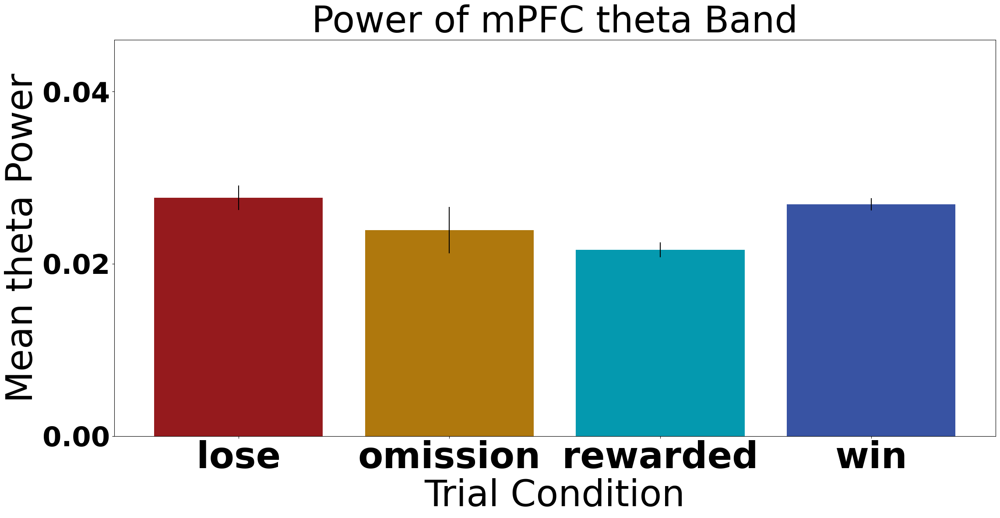

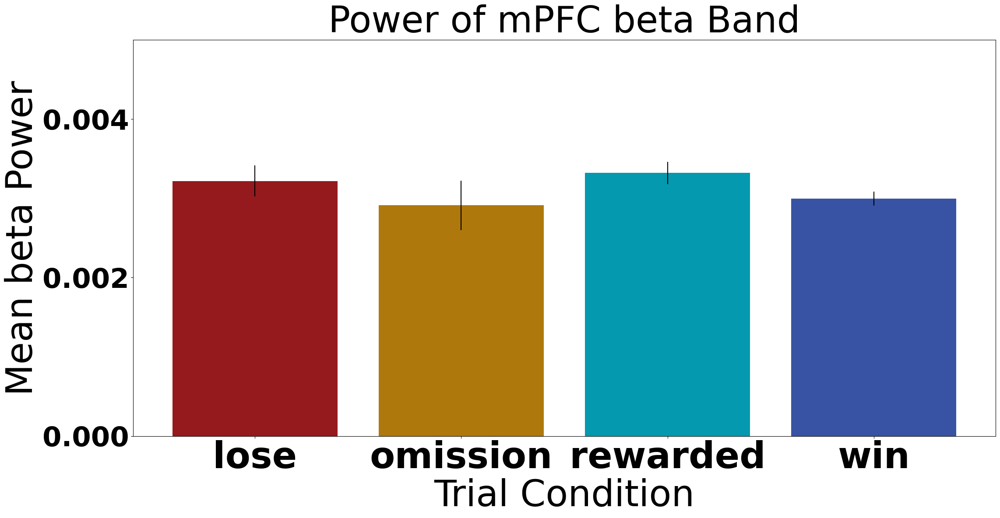

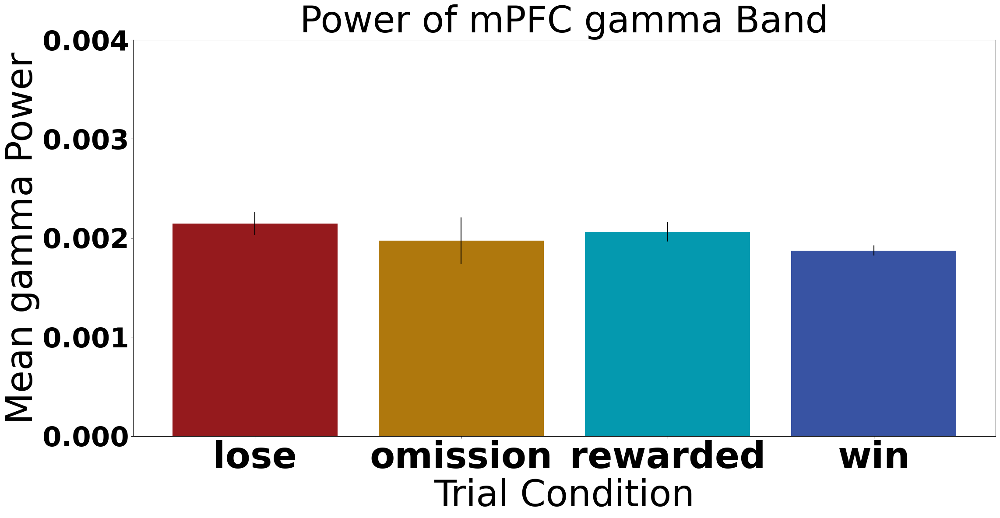

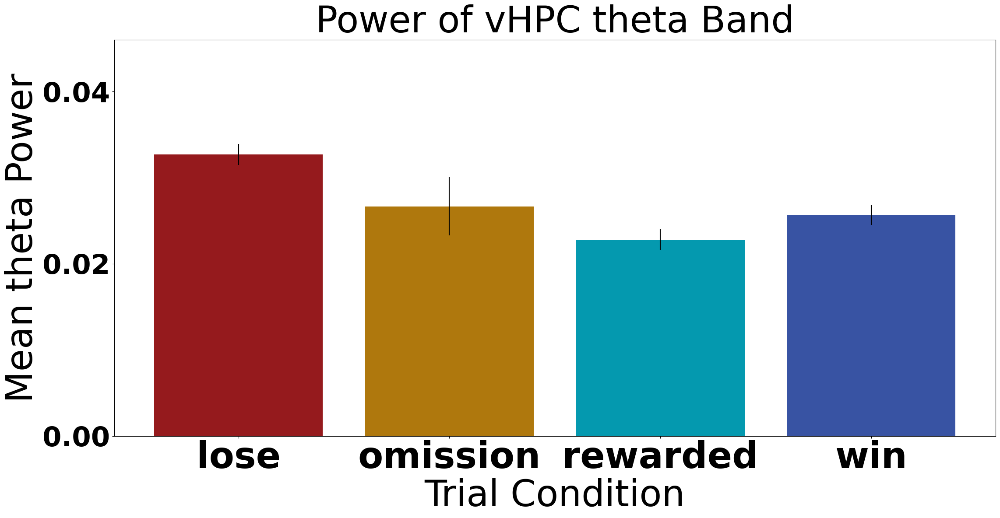

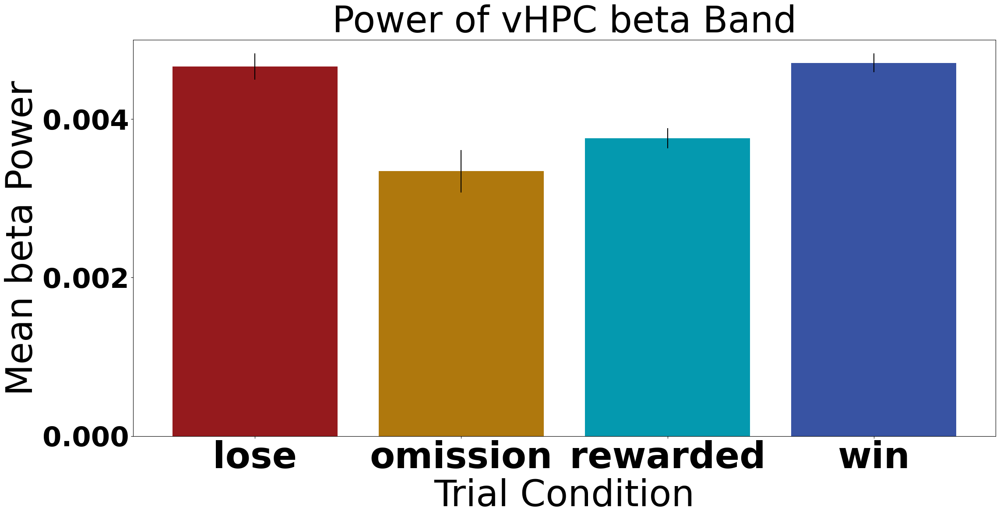

...

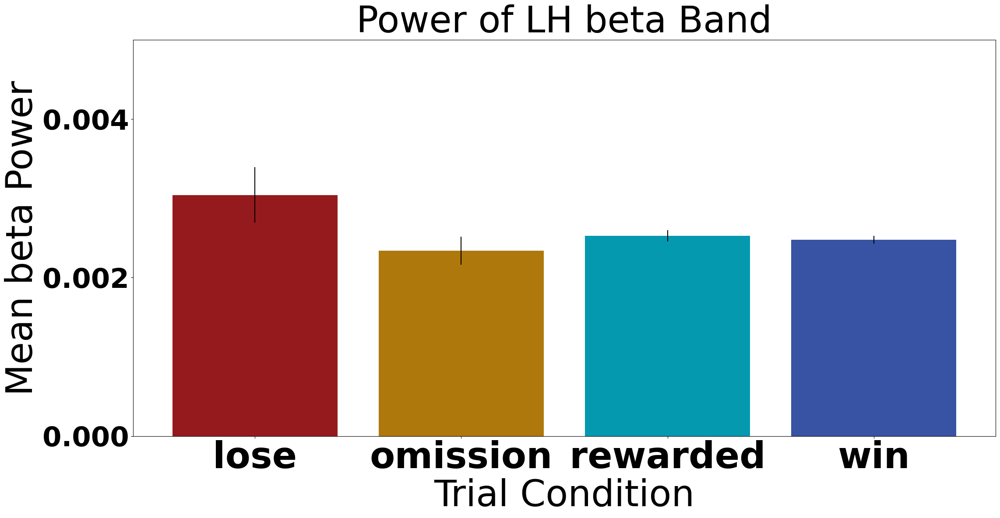

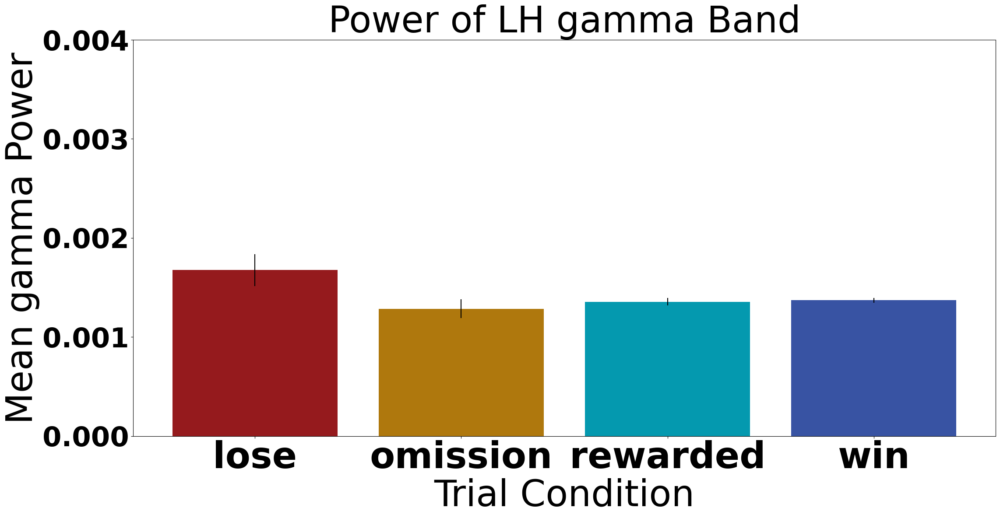

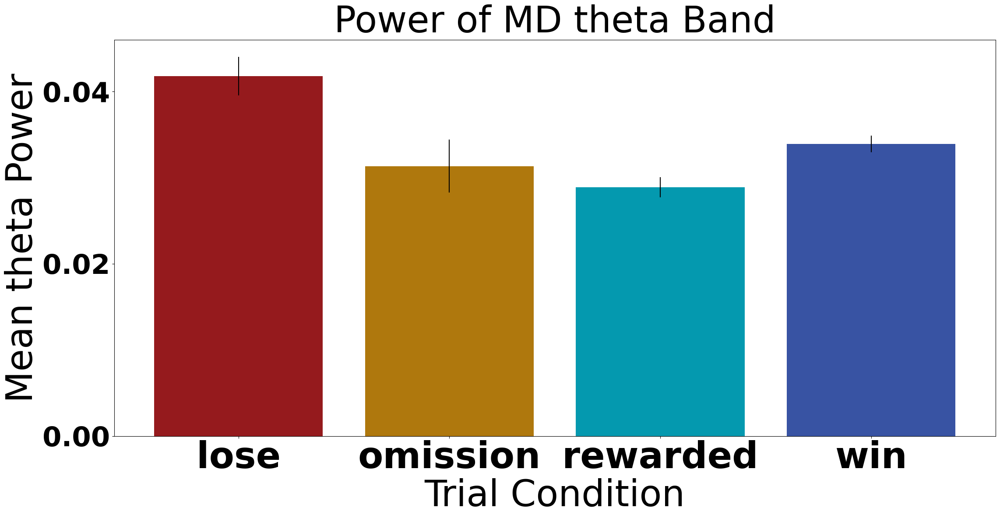

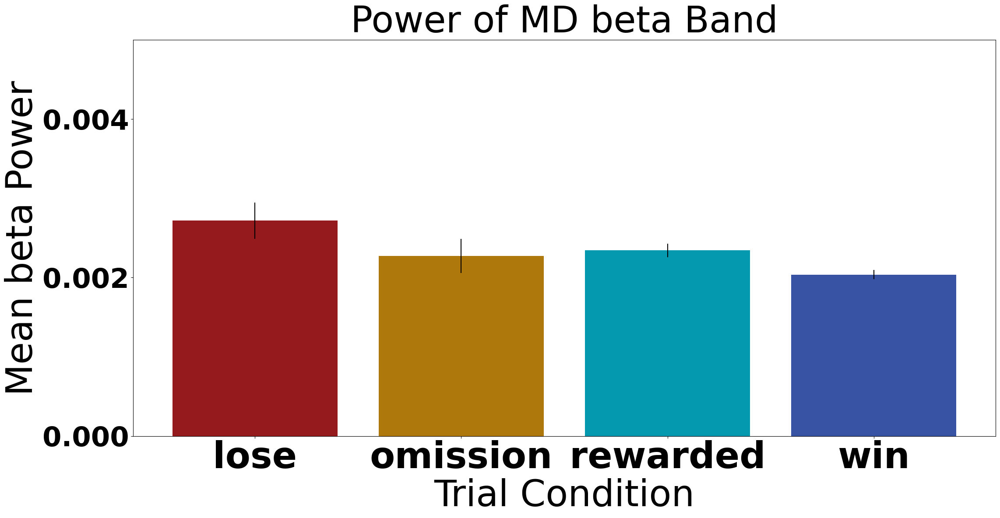

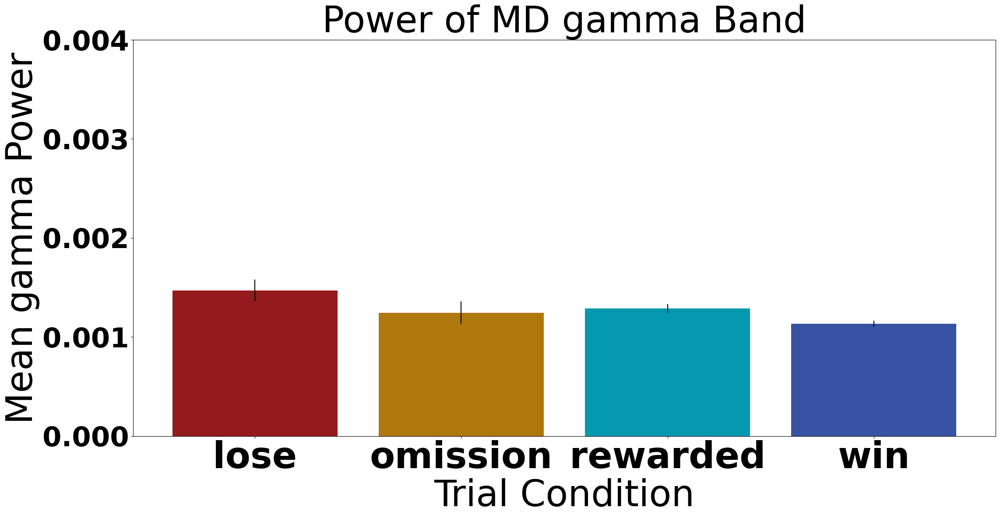

In [121]:
bonferroni_threshold = 0.05 / len(OUTCOME_COMPARISONS)


for col in mean_power_col:

    # colors = [outcome_colors.get(outcome, "gray") for outcome in mean_region_df["trial_outcome"]]
    # clean_region_name = region.replace("spike_interface_", "")
    region = col.split("_")[0]
    baseline_or_trial = col.split("_")[1]
    band = col.split("_")[2]
    if baseline_or_trial != "trial":
        continue
    # fig, ax = plt.subplots(figsize=(23, 12))
    # fig, ax = plt.subplots()
    fig, ax = plt.subplots(figsize=(23, 12))

    plt.title("Power of {} {} Band".format(region, band), fontsize=60)
    plt.xlabel("Trial Condition", fontsize=60)
    plt.ylabel("Mean {} Power".format(band), fontsize=60)

    plt.xticks(fontsize=60)
    plt.yticks(fontsize=45)
    plt.locator_params(axis='y', nbins=4)
    plt.ylim(0, round(mean_power_df[[col for col in mean_power_df.columns if band in col and "trial" in col]].to_numpy().max() * 1.1, 3))

    bars = plt.bar(mean_power_df["trial_outcome"], mean_power_df[col], yerr=sem_power_df[col], color=mean_power_df["color"])
    """
    # Get the y-axis limits
    bottom, top = ax.get_ylim()
    y_range = top - bottom

    # Retrieve x-coordinates of the bars
    x_coords = [bar.get_x() + bar.get_width() / 2.0 for bar in bars]  # get_x() retrieves the left coordinate, we adjust by half the width to get the center
    group_to_x_coord = {group: x_coord for group, x_coord in zip(mean_power_df["trial_outcome"].values, x_coords)}

    current_df = rank_sum_df[(rank_sum_df["region"] == region) & (rank_sum_df["band"] == band)]
    for index, row in current_df.iterrows():
        p_value = row["mannwhitneyu_pvalue"]
        x1 = list(row["all_outcomes"])[0]
        x2 = list(row["all_outcomes"])[1]
        
        if p_value < bonferroni_threshold:
            if p_value < 0.001 / len(OUTCOME_COMPARISONS):
                sig_symbol = '***'
            elif p_value < 0.01 / len(OUTCOME_COMPARISONS):
                sig_symbol = '**'
            elif p_value < 0.05 / len(OUTCOME_COMPARISONS):
                sig_symbol = '*'
            else:
                continue
            # What level is this bar among the bars above the plot?
            level = len(OUTCOME_COMPARISONS) - i
            # Plot the bar
            bar_height = (y_range * 0.055 * level) + top * 0.5
            bar_tips = bar_height - (y_range * 0.025)
            plt.plot(
                # [x1, x1, x2, x2],
                [x2, x2, x1, x1],

                [bar_tips, bar_height, bar_height, bar_tips], lw=5, c='k'
            )
            
            text_height = bar_height * 0.95 + (y_range / 100)
            plt.text((group_to_x_coord[x1] + group_to_x_coord[x2]) * 0.5, text_height, sig_symbol, ha='center', va='bottom', c='k', size=50)
    """    
    
    plt.tight_layout()
    plt.savefig("./proc/velocity_parsed_power/rce_{}_{}_averaged_power.png".format(region, band))
    plt.show()
    plt.close()

# Exporting the power spectra

In [101]:
trace_columns

['mPFC_baseline_lfp_trace',
 'mPFC_trial_lfp_trace',
 'vHPC_baseline_lfp_trace',
 'vHPC_trial_lfp_trace',
 'BLA_baseline_lfp_trace',
 'BLA_trial_lfp_trace',
 'LH_baseline_lfp_trace',
 'LH_trial_lfp_trace',
 'MD_baseline_lfp_trace',
 'MD_trial_lfp_trace']

In [102]:
exported_lfp_and_sleap = MERGED_LFP_AND_SLEAP.drop(columns=trace_columns, errors="ignore").copy()
exported_lfp_and_sleap = exported_lfp_and_sleap.drop(columns=[col for col in exported_lfp_and_sleap if "multitaper" in col], errors="ignore")
exported_lfp_and_sleap = exported_lfp_and_sleap.drop(columns=[col for col in exported_lfp_and_sleap if "thorax_velocity" in col], errors="ignore")
exported_lfp_and_sleap = exported_lfp_and_sleap.drop(columns=[col for col in exported_lfp_and_sleap if "frequencies" in col], errors="ignore")
exported_lfp_and_sleap = exported_lfp_and_sleap.drop(columns=[col for col in exported_lfp_and_sleap if "windowed_power" in col], errors="ignore")
exported_lfp_and_sleap = exported_lfp_and_sleap.drop(columns=[col for col in exported_lfp_and_sleap if "connectivity" in col], errors="ignore")
exported_lfp_and_sleap = exported_lfp_and_sleap.drop(columns=[col for col in exported_lfp_and_sleap if "spike_interface" in col], errors="ignore")
exported_lfp_and_sleap = exported_lfp_and_sleap.drop(columns=[col for col in exported_lfp_and_sleap if "index" in col], errors="ignore")
exported_lfp_and_sleap = exported_lfp_and_sleap.drop(columns=[col for col in exported_lfp_and_sleap if "stamp" in col], errors="ignore")
exported_lfp_and_sleap = exported_lfp_and_sleap.drop(columns=[col for col in exported_lfp_and_sleap if "box" in col], errors="ignore")
exported_lfp_and_sleap = exported_lfp_and_sleap.drop(columns=[col for col in exported_lfp_and_sleap if "height" in col], errors="ignore")
exported_lfp_and_sleap = exported_lfp_and_sleap.drop(columns=[col for col in exported_lfp_and_sleap if "width" in col], errors="ignore")
exported_lfp_and_sleap = exported_lfp_and_sleap.drop(columns=[col for col in exported_lfp_and_sleap if "ratio" in col], errors="ignore")
exported_lfp_and_sleap = exported_lfp_and_sleap.drop(columns=[col for col in exported_lfp_and_sleap if "width" in col], errors="ignore")
exported_lfp_and_sleap = exported_lfp_and_sleap.drop(columns=['individual_subj',
 'all_subj',
 'recording_name',
 'track_names',
 'subject_id',
 'corner_path',
 'corner_parts',
 'rescaled_locations',
 'reward_port'], errors="ignore")
# exported_lfp_and_sleap = exported_lfp_and_sleap.drop(columns=[col for col in exported_lfp_and_sleap if "all_window_power" in col], errors="ignore")
exported_lfp_and_sleap = exported_lfp_and_sleap.drop(columns=[col for col in exported_lfp_and_sleap if "window_averaged_power" in col], errors="ignore")
exported_lfp_and_sleap = exported_lfp_and_sleap.drop(columns=[col for col in exported_lfp_and_sleap if "all_power" in col], errors="ignore")





In [103]:
exported_lfp_and_sleap["frequencies"] = [MERGED_LFP_AND_SLEAP["BLA_baseline_frequencies"].iloc[0] for _ in range(len(exported_lfp_and_sleap))] 

In [104]:
for col in exported_lfp_and_sleap.columns:
    print(col)

time
recording_file
video_number
current_subject
recording_dir
video_file
video_frame
subject_info
competition_closeness
video_name
all_subjects
trial_outcome
baseline_videoframe_range
trial_videoframe_range
trial_number
Cohort
file_path
start_frame
stop_frame
mPFC_baseline_all_window_power
mPFC_trial_all_window_power
vHPC_baseline_all_window_power
vHPC_trial_all_window_power
BLA_baseline_all_window_power
BLA_trial_all_window_power
LH_baseline_all_window_power
LH_trial_all_window_power
MD_baseline_all_window_power
MD_trial_all_window_power
binned_trial_velocity_mask
binned_baseline_velocity_mask
mPFC_baseline_theta_mean_power
mPFC_baseline_beta_mean_power
mPFC_baseline_gamma_mean_power
vHPC_baseline_theta_mean_power
vHPC_baseline_beta_mean_power
vHPC_baseline_gamma_mean_power
BLA_baseline_theta_mean_power
BLA_baseline_beta_mean_power
BLA_baseline_gamma_mean_power
LH_baseline_theta_mean_power
LH_baseline_beta_mean_power
LH_baseline_gamma_mean_power
MD_baseline_theta_mean_power
MD_baseli

In [105]:
exported_lfp_and_sleap.to_pickle("./proc/rce_lfp_power_and_velocity_region_col_baselinetrial_row.pkl")

In [106]:
raise ValueError()

ValueError: 

# Reformatting the data

In [ ]:
exported_lfp_and_sleap

In [ ]:
window_averaged_power_columns

In [ ]:
exported_lfp_and_sleap = exported_lfp_and_sleap.drop(columns=[col for col in exported_lfp_and_sleap if "all_window" in col], errors="ignore")


In [ ]:
exported_lfp_and_sleap = pd.melt(exported_lfp_and_sleap, value_vars=window_averaged_power_columns, value_name="power", id_vars=[col for col in exported_lfp_and_sleap.columns if col not in window_averaged_power_columns], var_name="region_and_baseline_or_trial")



In [ ]:
exported_lfp_and_sleap

In [ ]:
exported_lfp_and_sleap["brain_region"] = exported_lfp_and_sleap["region_and_baseline_or_trial"].apply(lambda x: x.split("_")[0].strip())

In [ ]:
exported_lfp_and_sleap["trial_or_baseline"] = exported_lfp_and_sleap["region_and_baseline_or_trial"].apply(lambda x: x.split("_")[1].strip())

In [ ]:
exported_lfp_and_sleap.head()

In [ ]:
exported_lfp_and_sleap = exported_lfp_and_sleap.dropna(subset="power")
exported_lfp_and_sleap = exported_lfp_and_sleap[exported_lfp_and_sleap["trial_or_baseline"] == "trial"]
exported_lfp_and_sleap["all_theta_power"] = exported_lfp_and_sleap["power"].apply(lambda x: x[4:13])
exported_lfp_and_sleap["all_beta_power"] = exported_lfp_and_sleap["power"].apply(lambda x: x[13:31])
exported_lfp_and_sleap["all_gamma_power"] = exported_lfp_and_sleap["power"].apply(lambda x: x[30:91])
exported_lfp_and_sleap["mean_theta_power"] = exported_lfp_and_sleap["all_theta_power"].apply(lambda x: x.mean())
exported_lfp_and_sleap["mean_beta_power"] = exported_lfp_and_sleap["all_beta_power"].apply(lambda x: x.mean())
exported_lfp_and_sleap["mean_gamma_power"] = exported_lfp_and_sleap["all_gamma_power"].apply(lambda x: x.mean())

In [ ]:
exported_lfp_and_sleap.head()

In [ ]:
exported_lfp_and_sleap

In [ ]:
exported_lfp_and_sleap.to_pickle("./proc/rce_velocity_parsed_power_spectra_region_and_baselinetrial_rows.pkl")